# CZ4041 ML Project (Time Series Models)

Project Choice: https://www.kaggle.com/competitions/demand-forecasting-kernels-only

Goal: Predict 3 months of sales for 50 different items at 10 different stores

#### Workflow
1. Data Cleaning, EDA and Transformations
2. Model Time Series
3. Evaluate Model
4. Model Improvements
5. Conclusion

In [205]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.express as px
import random
import utils
import tstests

%matplotlib inline
from pylab import rcParams
rcParams['figure.figsize'] = 10, 5
plt.style.use('seaborn')

import plotly.offline as pyo
import plotly.io as pio
import plotly.graph_objects as go
pio.templates.default = 'plotly'
pyo.init_notebook_mode()

pd.options.display.max_columns = 100
pd.options.display.max_rows = 500

import warnings
warnings.simplefilter('ignore')

from IPython.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

In [225]:
all_train_data = pd.read_csv("demand-forecasting-kernels-only/train.csv")
all_train_data['date'] = all_train_data['date'].astype('datetime64[ns]')
all_train_data = all_train_data.set_index('date')

In [3]:
split_date = pd.to_datetime('2017-10-01')
train_data = all_train_data[all_train_data.index < split_date]
valid_data = all_train_data[all_train_data.index >= split_date]
print(train_data.shape)
print(valid_data.shape)

(867000, 3)
(46000, 3)


# Time Series Models

We can start with some naive modelling and see how it performs. We will use this as a benchmark to measure our more complex models. We shall use sMAPE as the metric to select the best model to tune

1. Naive Rolling Mean
2. MSTL Forecast
3. SARIMAX
    * Seasonal Dummy Variables
    * Fourier Terms
4. VARMAX

## Naive Rolling Mean

In [4]:
def get_rolling_mean_forecast(train, valid, **f_kwargs):
    train_ts = train.sales
    valid_ts = valid.sales
    
    preds_train = train_ts.rolling(window=f_kwargs['w'], closed='left').mean()
    preds_valid = np.full_like(valid_ts.values, preds_train[-1])

    return preds_train, preds_valid

In [5]:
si_scores_dict = {}
for i in range(50):
    for s in range(10):
        si_scores_dict[f's{s+1}_i{i+1}'] = []
si_scores_df = pd.DataFrame.from_dict(si_scores_dict, orient='index')
scores_dict = {'train' : [], 'valid': []}
scores_df = pd.DataFrame.from_dict(scores_dict)

In [6]:
kwargs_rolling = {
    'name' : 'rolling_mean',
    'f_kwargs' : { 'w': 365 }
}

train_res, valid_res, si_scores_df, scores_df = utils.run_model(train_data, valid_data, 
                                       si_scores_df, scores_df,
                                       get_rolling_mean_forecast, **kwargs_rolling)

(1,1)  train : 26.2411      valid : 24.7274
(1,2)  train : 23.6074      valid : 25.0534
(1,3)  train : 24.3306      valid : 19.0112
(1,4)  train : 25.245      valid : 23.3602
(1,5)  train : 26.4926      valid : 23.279
(1,6)  train : 27.0593      valid : 27.0672
(1,7)  train : 27.5489      valid : 26.9851
(1,8)  train : 25.0507      valid : 21.286
(1,9)  train : 25.6879      valid : 24.0222
(1,10)  train : 25.0828      valid : 21.6363
-----------------------------------------------------
Item 1 Train sMAPE : 25.6346
Item 1 Valid sMAPE : 23.6428
-----------------------------------------------------

(2,1)  train : 21.425      valid : 16.8127
(2,2)  train : 20.6689      valid : 17.9438
(2,3)  train : 21.4873      valid : 17.4579
(2,4)  train : 21.7781      valid : 17.8804
(2,5)  train : 21.5378      valid : 20.5441
(2,6)  train : 21.3921      valid : 21.0139
(2,7)  train : 22.4188      valid : 19.9844
(2,8)  train : 20.6682      valid : 17.7999
(2,9)  train : 21.2319      valid : 17.467
(

(18,8)  train : 20.2754      valid : 18.7119
(18,9)  train : 21.0698      valid : 18.943
(18,10)  train : 20.3325      valid : 18.0905
-----------------------------------------------------
Item 18 Train sMAPE : 20.7853
Item 18 Valid sMAPE : 18.2221
-----------------------------------------------------

(19,1)  train : 23.2523      valid : 20.8008
(19,2)  train : 21.5279      valid : 18.7977
(19,3)  train : 22.5923      valid : 20.1265
(19,4)  train : 22.8361      valid : 20.0082
(19,5)  train : 23.6017      valid : 21.5381
(19,6)  train : 23.9006      valid : 20.8436
(19,7)  train : 24.5285      valid : 23.7603
(19,8)  train : 21.8203      valid : 19.5458
(19,9)  train : 21.7976      valid : 18.7677
(19,10)  train : 21.8659      valid : 20.3693
-----------------------------------------------------
Item 19 Train sMAPE : 22.7723
Item 19 Valid sMAPE : 20.4558
-----------------------------------------------------

(20,1)  train : 21.4644      valid : 17.4122
(20,2)  train : 21.1867      va

(32,7)  train : 23.4341      valid : 22.3823
(32,8)  train : 21.7337      valid : 21.9207
(32,9)  train : 22.2148      valid : 20.1229
(32,10)  train : 22.004      valid : 20.226
-----------------------------------------------------
Item 32 Train sMAPE : 22.3561
Item 32 Valid sMAPE : 20.5313
-----------------------------------------------------

(33,1)  train : 21.128      valid : 17.4942
(33,2)  train : 21.1727      valid : 20.1336
(33,3)  train : 20.5692      valid : 17.5199
(33,4)  train : 20.5706      valid : 19.3954
(33,5)  train : 21.8432      valid : 21.1269
(33,6)  train : 21.295      valid : 18.8822
(33,7)  train : 22.0027      valid : 20.5463
(33,8)  train : 20.5284      valid : 19.8659
(33,9)  train : 20.5963      valid : 19.1465
(33,10)  train : 21.0183      valid : 19.7551
-----------------------------------------------------
Item 33 Train sMAPE : 21.0724
Item 33 Valid sMAPE : 19.3866
-----------------------------------------------------

(34,1)  train : 25.1966      valid

-----------------------------------------------------
Item 45 Train sMAPE : 20.9015
Item 45 Valid sMAPE : 18.7567
-----------------------------------------------------

(46,1)  train : 21.2909      valid : 19.6309
(46,2)  train : 21.2877      valid : 18.7565
(46,3)  train : 21.3368      valid : 16.9861
(46,4)  train : 21.6158      valid : 18.5807
(46,5)  train : 21.8618      valid : 20.6805
(46,6)  train : 22.9126      valid : 19.4694
(46,7)  train : 22.9747      valid : 19.8839
(46,8)  train : 21.016      valid : 17.662
(46,9)  train : 20.9649      valid : 18.6035
(46,10)  train : 21.4263      valid : 20.7903
-----------------------------------------------------
Item 46 Train sMAPE : 21.6687
Item 46 Valid sMAPE : 19.1044
-----------------------------------------------------

(47,1)  train : 25.545      valid : 24.285
(47,2)  train : 23.784      valid : 21.5821
(47,3)  train : 24.6995      valid : 20.3077
(47,4)  train : 25.4984      valid : 21.5707
(47,5)  train : 27.4433      valid :

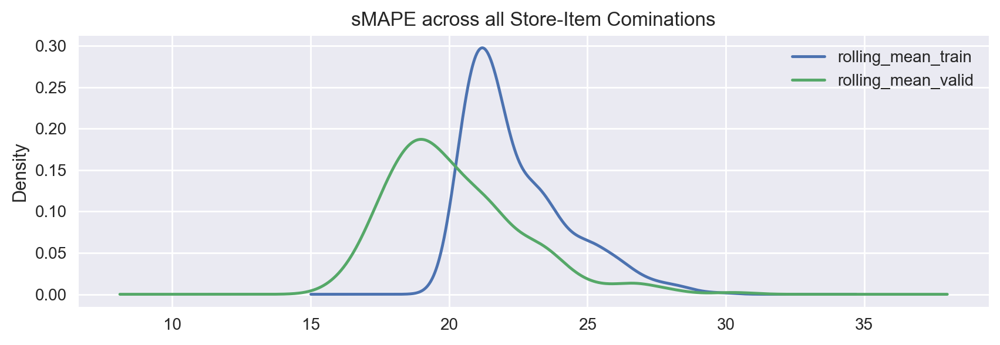

In [7]:
utils.plot_smape(si_scores_df, 'rolling_mean')

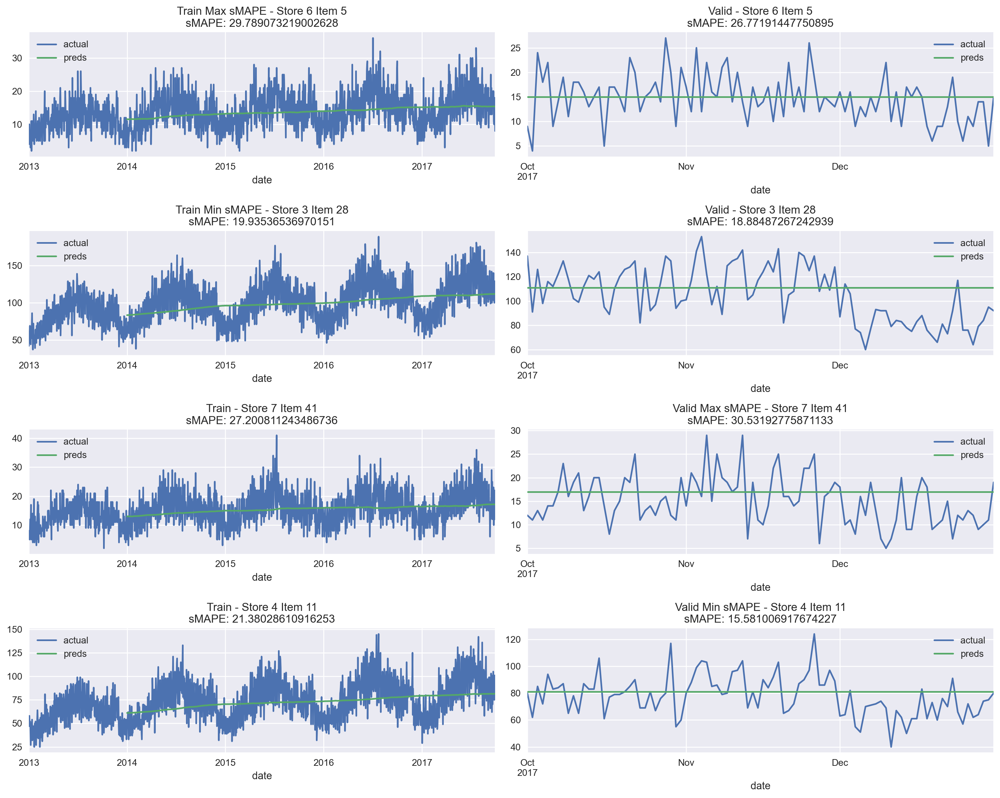

In [8]:
utils.plot_min_max_smape(train_res, valid_res, si_scores_df, 'rolling_mean')

In [9]:
scores_df

,train,valid
rolling_mean,22.437843,20.195443


## Forecasting with Decomposition: MSTL Fit

Extrapoloating the moving average of the past year/half year for different time series clearly does not capture dynamic movements but serves as a good benchmark.

From MSTL, we have shown that there exists more than 1 seasonality component in our time series. Thus an approach we can use is to naively fit polynomials and fourier terms to the trend and seasonal components respectively. 

In [12]:
from statsmodels.tsa.seasonal import MSTL
import scipy as sp

def fourier(x, *a, tau):
    ret = a[0]
    num_terms = (len(a) - 1) // 2
    for deg in range(1, num_terms + 1):
        ret += a[deg] * np.cos(deg * np.pi / tau * x) + a[num_terms + deg] * np.sin(deg * np.pi / tau * x)
    return ret

def fft_dominant_freqs(x, k):
    fft_result = np.fft.fft(x)
    frequencies = np.fft.fftfreq(len(x), d=1)

    positive_freqs = frequencies[:len(frequencies)//2]
    positive_fft_result = 2.0/len(fft_result) * np.abs(fft_result[:len(frequencies)//2])
    sorted_indices = np.argsort(-positive_fft_result)
    dominant_freqs = positive_freqs[sorted_indices[:k]]
    
    return dominant_freqs

def curve_fit_wrapper(x_data, y_data, tau_value, initial_guess):
    func_to_fit = lambda x, *a: fourier(x, *a, tau=tau_value)
    popt, pcov = sp.optimize.curve_fit(func_to_fit, x_data, y_data, p0=initial_guess)
    return popt, pcov

def get_mstl_forecast(train, valid, components=False, **f_kwargs):
    train_ts = train.sales.sort_index()
    train_size = len(train_ts)
    valid_size = len(valid.sales)
    x_train = np.arange(train_size)
    x_valid = np.arange(start=train_size, stop=train_size+valid_size)
    
    # decompose
    p = f_kwargs['p']
    mstl = MSTL(train_ts, periods=p, iterate=3, stl_kwargs={'seasonal_deg':0})
    res = mstl.fit()
    trend = res.trend + res.resid
    seasonals = res.seasonal
    train_components = []
    valid_components = []
    
    # fit trend component
    p_trend_fit = np.polyfit(x_train, trend.values, f_kwargs['poly_fit_terms'])
    fcast = np.poly1d(p_trend_fit)
    train_components.append(fcast(x_train)) # train
    valid_components.append(fcast(x_valid)) # valid
    
    # fit seasonal components
    # get dominant freqs for each period
    num_periods = len(f_kwargs['p'])
    for i in range(num_periods):
        dominant_freqs = fft_dominant_freqs(seasonals.iloc[:, i], f_kwargs['fourier_terms'])
        y_train = seasonals.iloc[:,i]
        tau = f_kwargs['p'][i]
        popt, pcov = curve_fit_wrapper(x_train, y_train, tau, dominant_freqs)
        train_components.append(fourier(x_train, *popt, tau=tau))
        valid_components.append(fourier(x_valid, *popt, tau=tau))

    if components:
        return train_components, valid_components
    else:    
        preds_train = np.sum(train_components, axis=0)
        preds_valid = np.sum(valid_components, axis=0)
        return preds_train, preds_valid

In [13]:
kwargs_mstl = {
    'name' : 'mstl_forecast',
    'f_kwargs' : {
        'p' : [7, 7*52],
        'poly_fit_terms' : 2,
        'fourier_terms' : 20
    }
}


train_res, valid_res, si_scores_df, scores_df = utils.run_model(train_res, valid_res, 
                                       si_scores_df, scores_df,
                                       get_mstl_forecast, **kwargs_mstl)

(1,1)  train : 19.0522      valid : 20.3492
(1,2)  train : 16.2028      valid : 18.3093
(1,3)  train : 17.1539      valid : 14.2043
(1,4)  train : 17.9231      valid : 18.4827
(1,5)  train : 20.9656      valid : 20.8773
(1,6)  train : 21.0255      valid : 21.3623
(1,7)  train : 21.8836      valid : 21.0589
(1,8)  train : 17.1843      valid : 15.2409
(1,9)  train : 18.1042      valid : 16.3825
(1,10)  train : 17.8124      valid : 15.157
-----------------------------------------------------
Item 1 Train sMAPE : 18.7307
Item 1 Valid sMAPE : 18.1424
-----------------------------------------------------

(2,1)  train : 12.5578      valid : 12.1624
(2,2)  train : 10.8005      valid : 11.0638
(2,3)  train : 11.5335      valid : 10.821
(2,4)  train : 11.6386      valid : 12.1694
(2,5)  train : 13.3031      valid : 14.1101
(2,6)  train : 13.0901      valid : 15.0092
(2,7)  train : 13.8287      valid : 15.2833
(2,8)  train : 10.9533      valid : 11.9517
(2,9)  train : 11.8458      valid : 10.752

(14,8)  train : 11.0602      valid : 11.7688
(14,9)  train : 11.6823      valid : 12.168
(14,10)  train : 11.5496      valid : 11.1383
-----------------------------------------------------
Item 14 Train sMAPE : 11.9999
Item 14 Valid sMAPE : 12.5024
-----------------------------------------------------

(15,1)  train : 10.8235      valid : 10.7662
(15,2)  train : 9.3012      valid : 9.1998
(15,3)  train : 9.6928      valid : 11.4225
(15,4)  train : 9.6774      valid : 9.7296
(15,5)  train : 11.3847      valid : 10.6317
(15,6)  train : 11.6008      valid : 13.1251
(15,7)  train : 11.8243      valid : 10.6866
(15,8)  train : 9.2474      valid : 9.9207
(15,9)  train : 9.9539      valid : 10.7305
(15,10)  train : 9.6235      valid : 10.3486
-----------------------------------------------------
Item 15 Train sMAPE : 10.313
Item 15 Valid sMAPE : 10.6561
-----------------------------------------------------

(16,1)  train : 17.7596      valid : 22.3204
(16,2)  train : 15.1801      valid : 16.6

(28,1)  train : 10.617      valid : 11.3118
(28,2)  train : 9.1774      valid : 10.1164
(28,3)  train : 9.4028      valid : 11.0489
(28,4)  train : 10.0036      valid : 11.2015
(28,5)  train : 11.1676      valid : 11.322
(28,6)  train : 11.2737      valid : 11.9457
(28,7)  train : 11.7559      valid : 12.6812
(28,8)  train : 9.2007      valid : 10.3939
(28,9)  train : 10.1363      valid : 9.7107
(28,10)  train : 9.4751      valid : 10.141
-----------------------------------------------------
Item 28 Train sMAPE : 10.221
Item 28 Valid sMAPE : 10.9873
-----------------------------------------------------

(29,1)  train : 11.2932      valid : 12.1419
(29,2)  train : 9.9693      valid : 11.2628
(29,3)  train : 10.4681      valid : 11.4513
(29,4)  train : 11.1479      valid : 9.9816
(29,5)  train : 12.49      valid : 13.5355
(29,6)  train : 12.0058      valid : 13.0903
(29,7)  train : 12.7555      valid : 14.1986
(29,8)  train : 10.5421      valid : 9.5812
(29,9)  train : 11.1256      valid

(41,6)  train : 22.0989      valid : 20.1911
(41,7)  train : 21.3493      valid : 25.9015
(41,8)  train : 17.0384      valid : 18.3385
(41,9)  train : 17.9376      valid : 20.5344
(41,10)  train : 17.7032      valid : 15.1577
-----------------------------------------------------
Item 41 Train sMAPE : 18.8165
Item 41 Valid sMAPE : 19.9322
-----------------------------------------------------

(42,1)  train : 14.1409      valid : 17.4337
(42,2)  train : 12.9862      valid : 10.928
(42,3)  train : 14.1084      valid : 15.8354
(42,4)  train : 14.0135      valid : 14.4193
(42,5)  train : 16.3018      valid : 15.8316
(42,6)  train : 16.2574      valid : 17.5293
(42,7)  train : 17.4503      valid : 17.9114
(42,8)  train : 13.3214      valid : 14.2206
(42,9)  train : 14.5709      valid : 16.8118
(42,10)  train : 13.9191      valid : 13.5638
-----------------------------------------------------
Item 42 Train sMAPE : 14.707
Item 42 Valid sMAPE : 15.4485
------------------------------------------

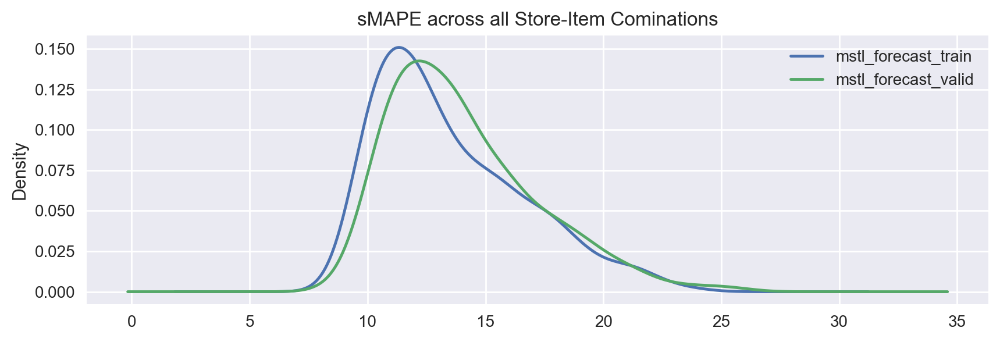

In [14]:
utils.plot_smape(si_scores_df, 'mstl_forecast')

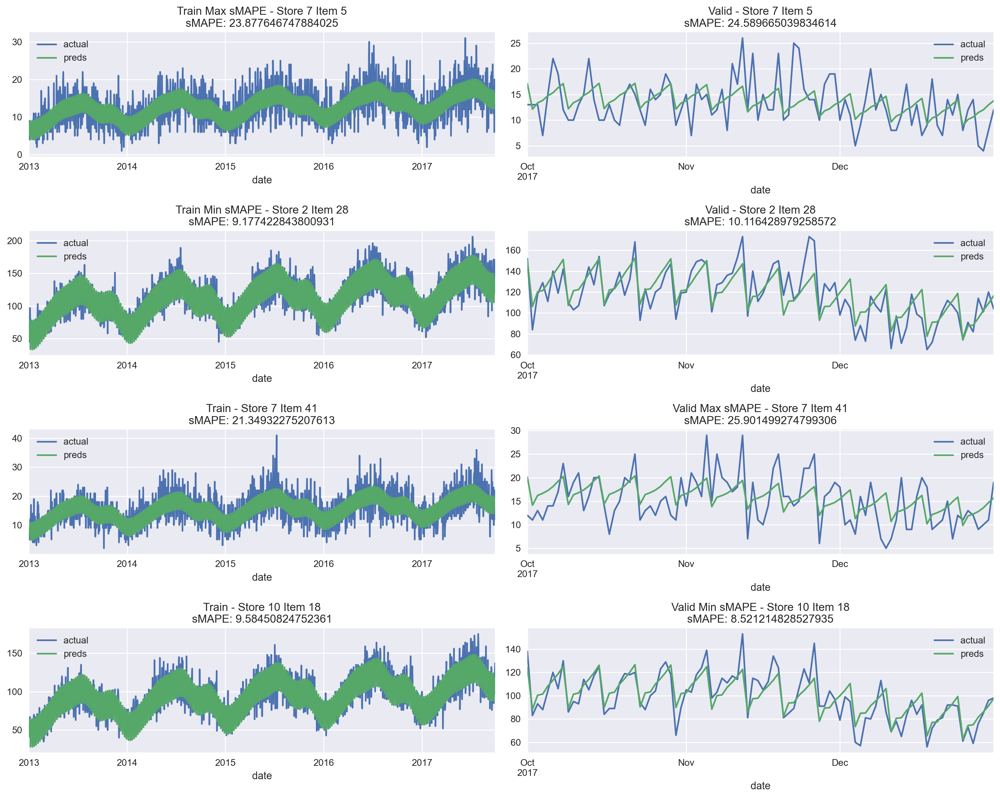

In [15]:
utils.plot_min_max_smape(train_res, valid_res, si_scores_df, 'mstl_forecast')

In [16]:
scores_df

,train,valid
rolling_mean,22.437843,20.195443
mstl_forecast,13.532152,14.055564


In [220]:
def display_res_analysis(valid_res, name, lags, dof):
    s_dict, acf_dict, s_arr, acf_arr = tstests.ts_res_analysis(valid_res, name, lags=lags, dof=dof)
    print(f'{len(s_arr)}/500 ({(len(s_arr)/500)*100}%) store-item time series failed stationarity test')
    print(f'{len(acf_arr)}/500 ({(len(acf_arr)/500)*100}%) store-item time series failed Ljung Box test')
    
    f, ax = plt.subplots(figsize=(12,3))
    tests_df = pd.concat([pd.DataFrame.from_dict(s_dict, orient='index'), pd.DataFrame.from_dict(acf_dict, orient='index')], axis=1)
    tests_df.columns = ['stationarity', 'acf']
    tests_df.plot.bar(ax=ax)
    ax.set_xlabel('Items')
    ax.set_title('Failed Tests grouped by Items')
    plt.show();
    
    i = acf_arr[0][0]
    s = acf_arr[0][1]
    
    tstests.plot_residuals(valid_res, s, i, name, lags)
    
    return s_arr, acf_arr

73/500 (14.6%) store-item time series failed stationarity test
372/500 (74.4%) store-item time series failed Ljung Box test


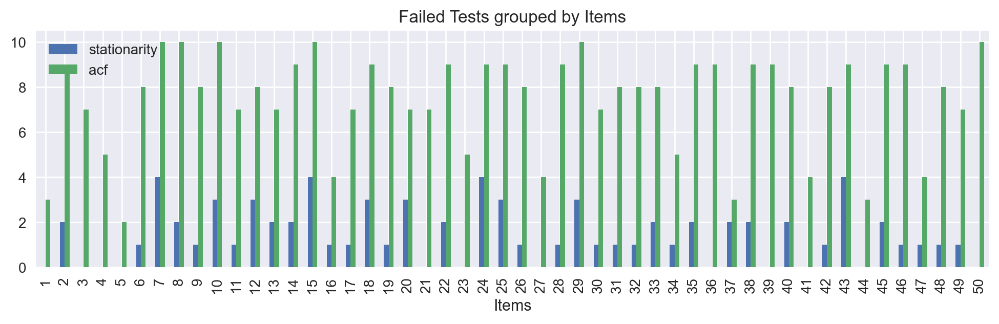

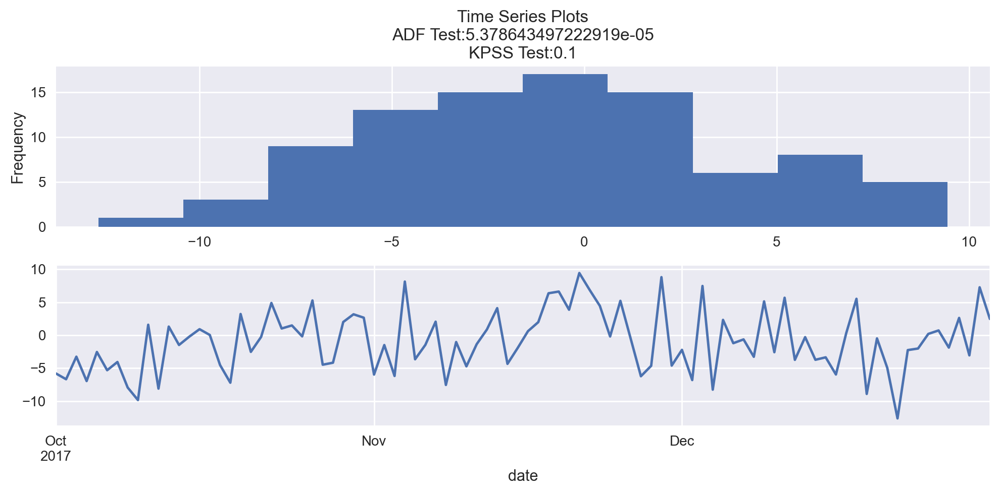

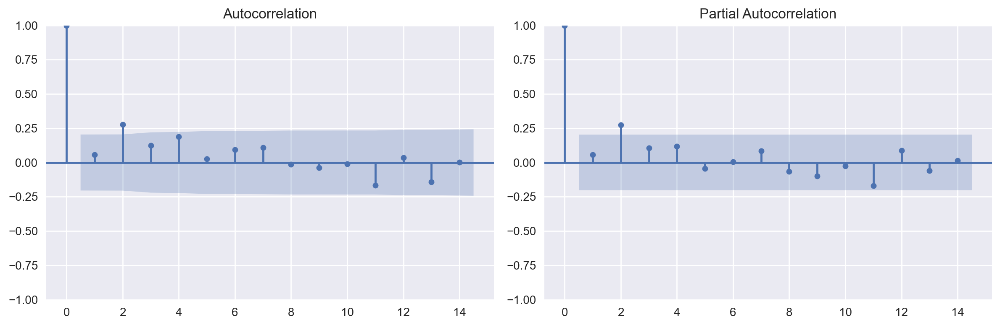

In [223]:
__, __ = display_res_analysis(valid_res, 'mstl_forecast', 14, 0)

We find that the MSTL decomposition forecast was not able to capture everything

## Forecasting with Decomposition : ARIMA -- not used

https://www.statsmodels.org/dev/examples/notebooks/generated/stl_decomposition.html

https://www.statsmodels.org/stable/generated/statsmodels.tsa.forecasting.stl.STLForecast.html

https://medium.com/swlh/dengai-predicting-disease-spread-stl-forecasting-arima-box-jenkins-5f03449179ac

In [ ]:
from statsmodels.tsa.forecasting.stl import STLForecast

In [ ]:
s7i5_train = train_data.loc[(train_data.store==7)&(train_data.item==5)].copy()
s7i5_valid = valid_data.loc[(valid_data.store==7)&(valid_data.item==5)].copy()

In [ ]:
stlf = STLForecast(s7i5_train.sales, smt.SARIMAX,
                   model_kwargs=dict(order=(2,1,1)),
                   period=7*52)
stlf_res = stlf.fit(fit_kwargs=dict(disp=False, method='powell'))
preds_train = stlf_res.get_prediction().predicted_mean
preds_valid = stlf_res.forecast(92)

In [ ]:
print(stlf_res.summary())

In [ ]:
stlf_res.model_result.plot_diagnostics(figsize=(12,6));

In [ ]:
f, ax = plt.subplots(2,1, figsize=(10,6))
s7i5_train.sales[8:].plot(ax=ax[0])
preds_train[8:].plot(ax=ax[0])
train_score = utils.sMAPE(s7i5_train.sales[8:], preds_train[8:])
ax[0].set_title(f'Train sMAPE: {train_score}')

s7i5_valid.sales.plot(ax=ax[1])
preds_valid.plot(ax=ax[1])
valid_score = utils.sMAPE(s7i5_valid.sales, preds_valid)
ax[1].set_title(f'Valid sMAPE: {valid_score}')

plt.tight_layout()
plt.show();

In [ ]:
resid = s7i5_valid.sales-preds_valid
tstests.ts_plots(resid)
tstests.acf_pacf_plots(resid)

In [ ]:
def get_deseasoned_forecast(train, valid, **f_kwargs):
    endog_train = train.sales
    
    stlf = STLForecast(endog_train, smt.SARIMAX,
                   model_kwargs=dict(order=f_kwargs['order'], 
                                     seasonal_order=f_kwargs['seasonal_order']),
                   period=f_kwargs['period'])
    
    stlf_res = stlf.fit(fit_kwargs=dict(disp=False, method='powell'))
    
    preds_train = stlf_res.get_prediction().predicted_mean
    preds_valid = stlf_res.forecast(valid.shape[0])
    
    return preds_train, preds_valid

In [ ]:
kwargs_deseasoned = {
    'name' : 'sarimax_deseasoned',
    'f_kwargs' : {
        'period' : 364,
        'order' : (2,1,1),
        'seasonal_order' : (0,0,0,0)
    }
}

In [ ]:
train_res, valid_res, si_scores_df, scores_df = utils.run_model(train_res, valid_res, 
                                       si_scores_df, scores_df,
                                       get_deseasoned_forecast, **kwargs_deseasoned)

In [ ]:
utils.plot_smape(si_scores_df, 'sarimax_deseasoned')

In [ ]:
utils.plot_min_max_smape(train_res.loc[abs(train_res.sarimax_deseasoned) < 1000],
                         valid_res.loc[abs(valid_res.sarimax_deseasoned) < 1000],
                         si_scores_df, 'sarimax_deseasoned')

In [ ]:
scores_df

## SARIMAX

Some clear disadvantages of using fourier terms to curve fit different seasonality components is that it fails to capture more granular and intracate details. 

From our EDA above, the data is clearly non-stationary with strong seasonalities (weekly and annually). This poses a challenge for SARIMA model as the SARIMA is only capable of handling single-seasonal periods. Thus, we can solve this issue with 2 approaches that account for long seasonal periods that the SARIMA model cannot capture:
1. Include week and month dummy variables
2. Fourier terms
3. MSTL Decomposition terms

### ACF, PACF Plots and initial SARIMAX params guess

We will use seasonally differenced + first differenced time series above to have an initial guess of our sarimax parameters and then tune a general model using auto arima to see if our initial guess is close 

In [ ]:
tstests.acf_pacf_plots(s2_i28.dropna())

In [ ]:
tstests.acf_pacf_plots(s7_i5.sales.diff(7).diff().dropna())

Ref: https://otexts.com/fpp3/non-seasonal-arima.html

ARIMA(0,d,q)
- PACF is decaying or sinusoidal
- significant spike at lag q in the ACF, but none beyond lag q

ARIMA(q,d,0)
- ACF is decaying or sinusoidal
- significant spike at lag p in the PACF, but none beyond lag p

Since we have applied both seasonal differencing with period = 7 and then applied a first difference on seasonal differenced data, d = 1 and D = 1 for our SARIMAX model. Looking at the ACF and PACF plots for the 2 store, item combinations, we see a similar structure persisting in both their ACFs and PACFs and could start fitting an ARIMA(0,1,1) for the non-seasonal components. 

For the seasonal components, a SARIMA(0,0,0)(0,0,1,7) will show
- spike at lag 7 in the ACF but no other significant spikes
- exponential decay in seasonal lags of PACF (i.e at lags 7, 14, 21...)

Similarly, a SARIMA(0,0,0)(1,0,0,7) will show 
- exponential decay in seasonal lags in ACF
- spike at lag 7 of PACF

Going by the above guidelines, it seems we can try fitting a SARIMA(5,1,1)(0,1,1,7) model to start

### Temporal Features

In [98]:
weekdays = ['Mon', 'Tues', 'Wed', 'Thu', 'Fri', 'Sat'] # weekly seasonality
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov'] # yearly seasonality

temporal_features = weekdays+months

def add_temporal_features(df):
    for i, x in enumerate(weekdays):
        df[x] = (df.index.weekday == i+1).astype(int)
    for i, x in enumerate(months):
        df[x] = (df.index.month == i+1).astype(int)
    return df

import statsmodels.tsa.api as smt

def get_sarimax_forecast(train, valid, **f_kwargs):
    train.index = pd.DatetimeIndex(train.index.values, freq=train.index.inferred_freq)
    endog_train = train.sales.sort_index()
    exog_train = train[f_kwargs['exog_vars']].sort_index()
    exog_valid = valid[f_kwargs['exog_vars']].sort_index()
        
    model = smt.SARIMAX(endog_train, exog=exog_train, **f_kwargs['sarimax_kwargs']) 
    model_fit = model.fit(maxiter=1000, method='powell', disp=False)
    
    preds_train = model_fit.predict(exog=exog_train)
    preds_valid = model_fit.forecast(steps=valid.index.nunique(), exog=exog_valid)
    
    return preds_train, preds_valid

In [18]:
train_data_cp = train_res.copy()
valid_data_cp = valid_res.copy()

train_data_cp = add_temporal_features(train_data_cp)
valid_data_cp = add_temporal_features(valid_data_cp)

In [19]:
train_data_cp.index = pd.DatetimeIndex(train_data_cp.index.values, freq=train_data_cp.index.inferred_freq)

endog_train = train_data_cp.loc[(train_data_cp.store == 7) & (train_data_cp.item == 5)].sales
exog_train = train_data_cp.loc[(train_data_cp.store == 7) & (train_data_cp.item == 5)][temporal_features]

endog_valid = valid_data_cp.loc[(valid_data_cp.store == 7) & (valid_data_cp.item == 5)].sales
exog_valid = valid_data_cp.loc[(valid_data_cp.store == 7) & (valid_data_cp.item == 5)][temporal_features]

#### pmdautoarima 

In [20]:
import pmdarima as pmd
models = pmd.auto_arima(endog_train,
                        exog_train,
                        start_p=0,
                        start_q=0,
                        start_P=0,
                        start_Q=0,
                        maxiter=100,
                        method='powell',
                        trace=True,
                        return_valid_fits=True,
                        stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=10614.207, Time=0.79 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=10104.053, Time=1.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=3.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=10612.208, Time=1.83 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9880.459, Time=1.79 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9788.638, Time=1.89 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9741.304, Time=3.09 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=9680.419, Time=2.95 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=9453.763, Time=8.23 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9434.537, Time=7.67 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=9437.262, Time=4.96 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=5.70 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=4.51 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=5.51 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9435.409

In [21]:
scores = []
for i in range(len(models)):
    m = models[i]
    preds = m.predict(n_periods=92, X=exog_valid)
    score = utils.sMAPE(endog_valid, preds)
    scores.append(score)
    print(i, m, score)
    
print(np.argsort(scores))

0  ARIMA(4,1,1)(0,0,0)[0] intercept 23.420004457654237
1  ARIMA(4,1,1)(0,0,0)[0]           23.37974979005039
2  ARIMA(3,1,1)(0,0,0)[0] intercept 23.530779334627958
3  ARIMA(5,1,1)(0,0,0)[0] intercept 23.58508787615257
4  ARIMA(5,1,0)(0,0,0)[0] intercept 25.530955696087748
5  ARIMA(4,1,0)(0,0,0)[0] intercept 29.416446310015214
6  ARIMA(3,1,0)(0,0,0)[0] intercept 33.902005516845776
7  ARIMA(2,1,0)(0,0,0)[0] intercept 41.70591811808179
8  ARIMA(1,1,0)(0,0,0)[0] intercept 80.40395454324278
9  ARIMA(0,1,0)(0,0,0)[0]           121.50858546607633
10  ARIMA(0,1,0)(0,0,0)[0] intercept 123.50330165380669
[ 1  0  2  3  4  5  6  7  8  9 10]


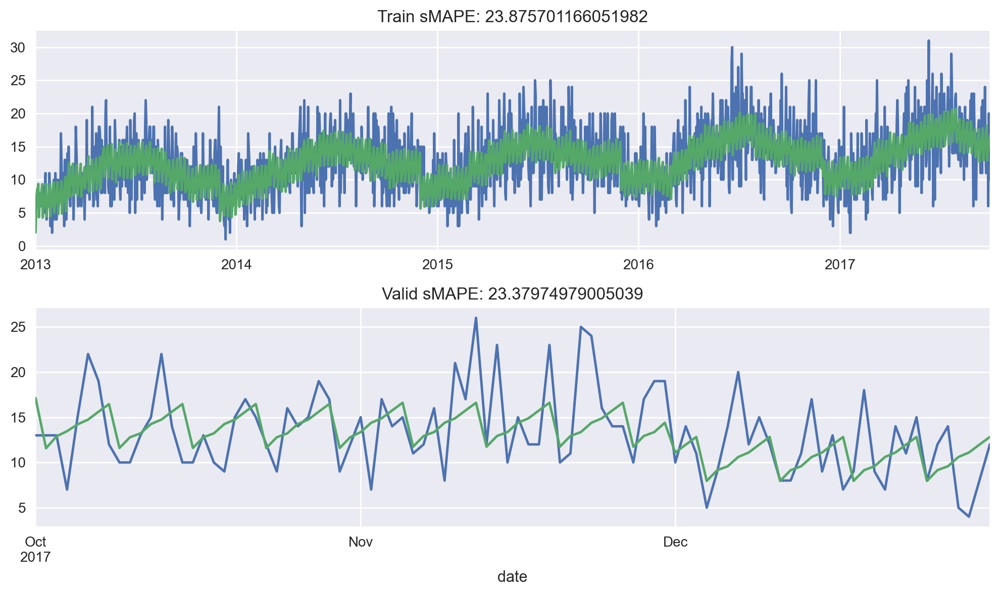

In [22]:
best_score = 1
f, ax = plt.subplots(2,1, figsize=(10,6))
endog_train[8:].plot(ax=ax[0])
models[best_score].fittedvalues().plot(ax=ax[0])
train_score = utils.sMAPE(endog_train[8:], models[best_score].fittedvalues())
ax[0].set_title(f'Train sMAPE: {train_score}')

endog_valid.plot(ax=ax[1])
models[best_score].predict(n_periods=92, X=exog_valid).plot(ax=ax[1])
valid_score = utils.sMAPE(endog_valid, models[best_score].predict(n_periods=92, X=exog_valid))
ax[1].set_title(f'Valid sMAPE: {valid_score}')

plt.tight_layout()
plt.show();

In [23]:
print(models[1].summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1734
Model:               SARIMAX(4, 1, 1)   Log Likelihood               -4694.705
Date:                Wed, 22 Nov 2023   AIC                           9435.409
Time:                        22:42:44   BIC                           9560.934
Sample:                    01-01-2013   HQIC                          9481.834
                         - 09-30-2017                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Mon            1.1876      0.356      3.337      0.001       0.490       1.885
Tues           1.6193      0.347      4.665      0.000       0.939       2.300
Wed            2.6470      0.339      7.806      0.0

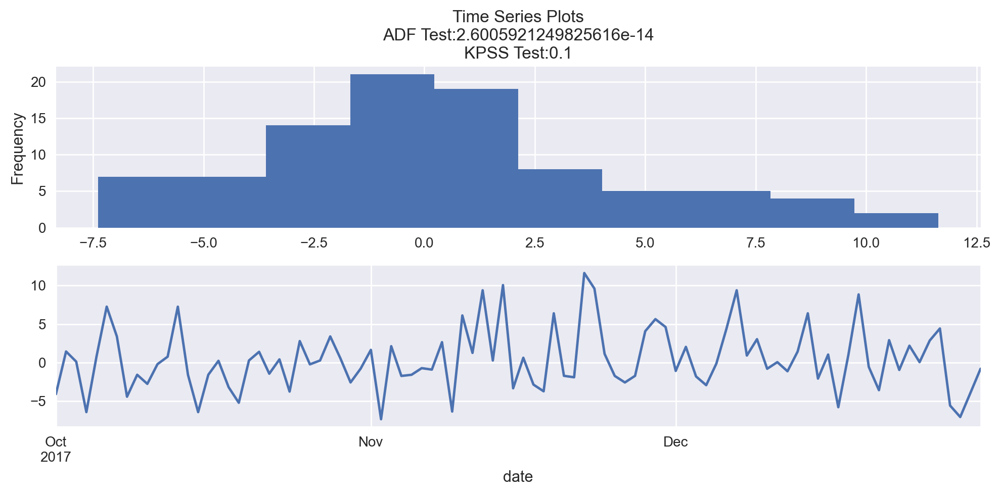

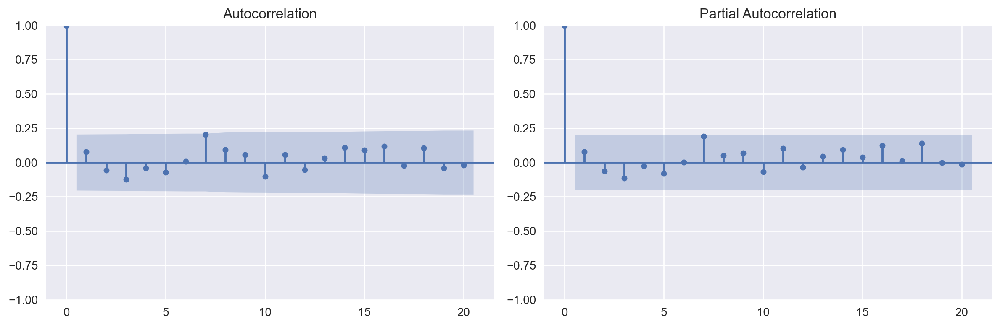

In [24]:
resid = endog_valid-models[1].predict(n_periods=92, X=exog_valid)
tstests.ts_plots(resid)
tstests.acf_pacf_plots(resid)

#### Fitting individual store-items

In [94]:
train_res = add_temporal_features(train_res.copy())
valid_res = add_temporal_features(valid_res.copy())

In [99]:
kwargs_sarimax = {
    'name' : 'sarimax',
    'f_kwargs' : {
        'sarimax_kwargs' : {
            'order': (4,1,1)
        },
        'exog_vars' : temporal_features
    }
}

train_res, valid_res, si_scores_df, scores_df = utils.run_model(train_res, valid_res, 
                                       si_scores_df, scores_df,
                                       get_sarimax_forecast, **kwargs_sarimax)

(1,1)  train : 18.7463      valid : 20.3077
(1,2)  train : 15.9278      valid : 17.1932
(1,3)  train : 17.0035      valid : 16.6048
(1,4)  train : 17.6389      valid : 17.37
(1,5)  train : 20.7465      valid : 20.0584
(1,6)  train : 20.8154      valid : 20.2274
(1,7)  train : 22.0165      valid : 22.4089
(1,8)  train : 16.8277      valid : 15.089
(1,9)  train : 17.5701      valid : 14.7958
(1,10)  train : 17.2108      valid : 12.9427
-----------------------------------------------------
Item 1 Train sMAPE : 18.4504
Item 1 Valid sMAPE : 17.6998
-----------------------------------------------------

(2,1)  train : 11.9375      valid : 10.1593
(2,2)  train : 10.0792      valid : 9.3968
(2,3)  train : 10.7875      valid : 8.3419
(2,4)  train : 11.1432      valid : 11.7221
(2,5)  train : 12.6414      valid : 13.3072
(2,6)  train : 12.681      valid : 12.4498
(2,7)  train : 13.4463      valid : 14.1976
(2,8)  train : 10.2209      valid : 9.0036
(2,9)  train : 11.1696      valid : 9.8499
(2,1

(14,9)  train : 11.0152      valid : 9.8117
(14,10)  train : 11.0229      valid : 10.0128
-----------------------------------------------------
Item 14 Train sMAPE : 11.4364
Item 14 Valid sMAPE : 10.7214
-----------------------------------------------------

(15,1)  train : 9.9569      valid : 9.2017
(15,2)  train : 8.2887      valid : 6.725
(15,3)  train : 8.791      valid : 9.3537
(15,4)  train : 8.8423      valid : 8.065
(15,5)  train : 10.6912      valid : 9.8243
(15,6)  train : 10.7151      valid : 12.4533
(15,7)  train : 11.158      valid : 9.0111
(15,8)  train : 8.4876      valid : 8.5426
(15,9)  train : 9.0793      valid : 8.9365
(15,10)  train : 8.8277      valid : 8.234
-----------------------------------------------------
Item 15 Train sMAPE : 9.4838
Item 15 Valid sMAPE : 9.0347
-----------------------------------------------------

(16,1)  train : 17.6897      valid : 20.9589
(16,2)  train : 14.7982      valid : 15.924
(16,3)  train : 15.3954      valid : 13.4473
(16,4)  tr

(28,1)  train : 9.7997      valid : 9.5843
(28,2)  train : 8.2617      valid : 8.8029
(28,3)  train : 8.6545      valid : 9.1719
(28,4)  train : 9.2005      valid : 9.8033
(28,5)  train : 10.3001      valid : 9.4519
(28,6)  train : 10.6346      valid : 9.8109
(28,7)  train : 11.0191      valid : 11.6027
(28,8)  train : 8.3846      valid : 8.7546
(28,9)  train : 9.4314      valid : 8.0299
(28,10)  train : 8.8709      valid : 8.3768
-----------------------------------------------------
Item 28 Train sMAPE : 9.4557
Item 28 Valid sMAPE : 9.3389
-----------------------------------------------------

(29,1)  train : 10.5694      valid : 10.9298
(29,2)  train : 9.0531      valid : 9.2034
(29,3)  train : 9.7813      valid : 9.7117
(29,4)  train : 10.5783      valid : 8.6523
(29,5)  train : 11.9169      valid : 11.5863
(29,6)  train : 11.4886      valid : 12.6454
(29,7)  train : 12.3457      valid : 11.8222
(29,8)  train : 9.5393      valid : 8.2166
(29,9)  train : 10.5729      valid : 11.0361


(41,7)  train : 21.1884      valid : 25.0319
(41,8)  train : 16.68      valid : 16.6529
(41,9)  train : 17.5602      valid : 19.5635
(41,10)  train : 17.5077      valid : 15.1631
-----------------------------------------------------
Item 41 Train sMAPE : 18.5408
Item 41 Valid sMAPE : 18.9622
-----------------------------------------------------

(42,1)  train : 13.9796      valid : 15.0818
(42,2)  train : 12.6258      valid : 10.3461
(42,3)  train : 13.503      valid : 14.1803
(42,4)  train : 13.5384      valid : 13.5239
(42,5)  train : 16.0357      valid : 14.5271
(42,6)  train : 16.0222      valid : 16.6034
(42,7)  train : 17.0416      valid : 16.9859
(42,8)  train : 12.839      valid : 12.6634
(42,9)  train : 13.8785      valid : 14.2035
(42,10)  train : 13.4278      valid : 12.1462
-----------------------------------------------------
Item 42 Train sMAPE : 14.2892
Item 42 Valid sMAPE : 14.0262
-----------------------------------------------------

(43,1)  train : 12.6896      valid

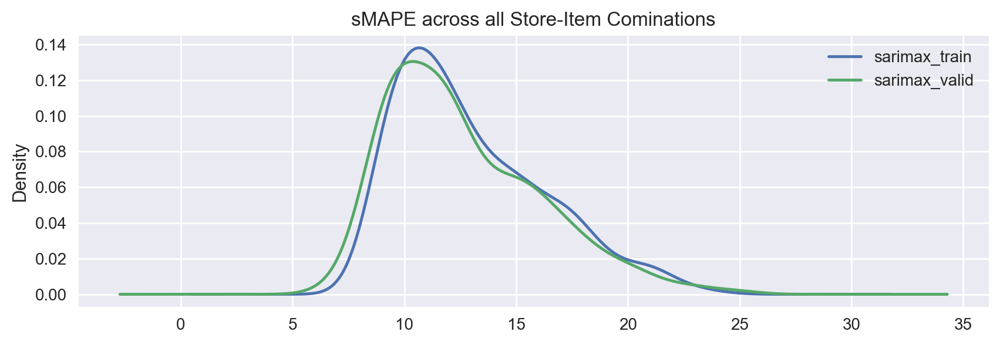

In [100]:
utils.plot_smape(si_scores_df, 'sarimax')

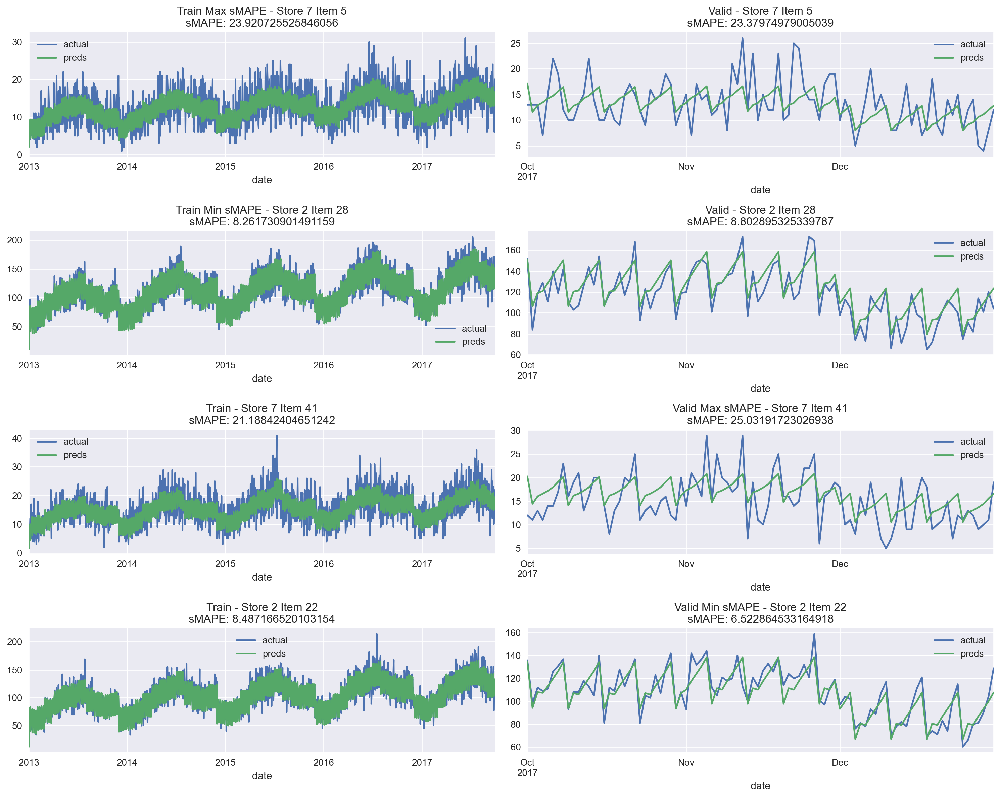

In [101]:
utils.plot_min_max_smape(train_res.loc[abs(train_res.sarimax) < 1000],
                         valid_res.loc[abs(valid_res.sarimax) < 1000],
                         si_scores_df, 'sarimax')

In [102]:
scores_df

,train,valid
rolling_mean,22.437843,20.195443
mstl_forecast,13.532152,14.055564
sarimax,13.001242,12.656115


5/500 (1.0%) store-item time series failed stationarity test
109/500 (21.8%) store-item time series failed Ljung Box test


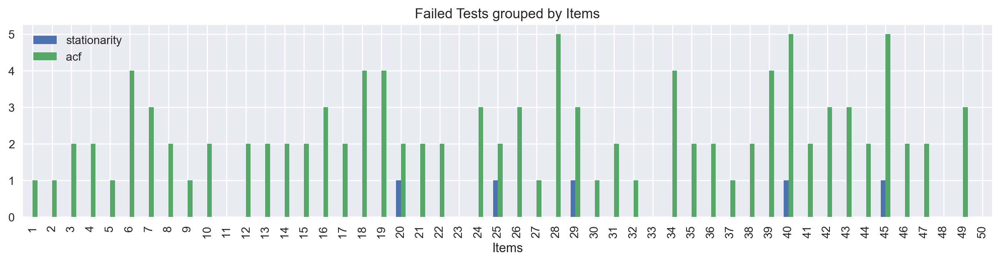

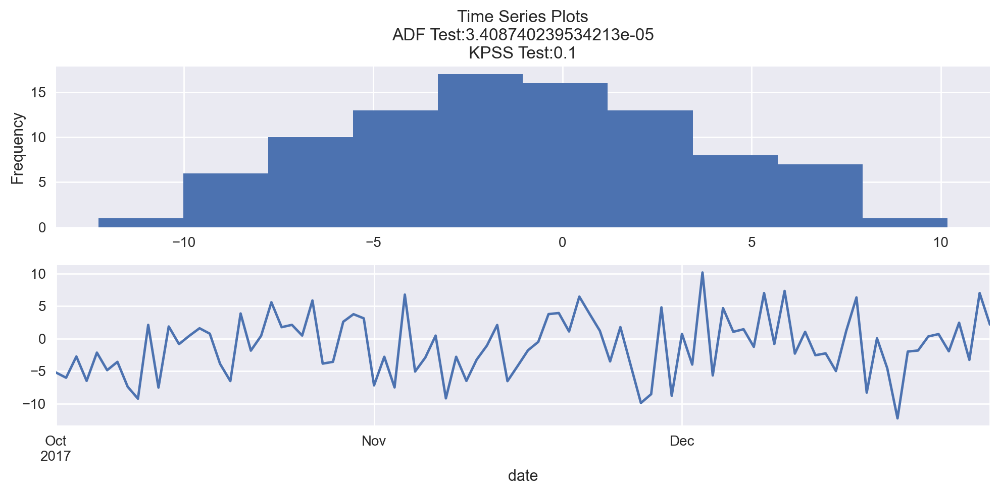

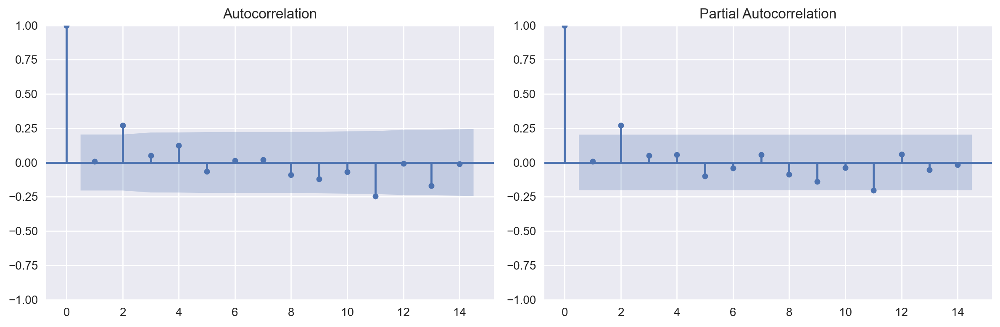

In [216]:
_, sarimax_acf_arr = display_res_analysis(valid_res, 'sarimax', 14, 0)

In [217]:
sarimax_acf_arr

[[1, 1],
 [2, 6],
 [3, 3],
 [3, 7],
 [4, 5],
 [4, 8],
 [5, 2],
 [6, 1],
 [6, 4],
 [6, 5],
 [6, 7],
 [7, 4],
 [7, 6],
 [7, 9],
 [8, 6],
 [8, 8],
 [9, 1],
 [10, 3],
 [10, 8],
 [12, 5],
 [12, 9],
 [13, 3],
 [13, 9],
 [14, 9],
 [14, 10],
 [15, 4],
 [15, 5],
 [16, 4],
 [16, 5],
 [16, 8],
 [17, 1],
 [17, 3],
 [18, 2],
 [18, 3],
 [18, 6],
 [18, 7],
 [19, 1],
 [19, 7],
 [19, 8],
 [19, 10],
 [20, 2],
 [20, 10],
 [21, 8],
 [21, 10],
 [22, 3],
 [22, 6],
 [24, 2],
 [24, 5],
 [24, 9],
 [25, 8],
 [25, 9],
 [26, 4],
 [26, 6],
 [26, 8],
 [27, 8],
 [28, 1],
 [28, 3],
 [28, 7],
 [28, 8],
 [28, 9],
 [29, 1],
 [29, 3],
 [29, 8],
 [30, 2],
 [31, 1],
 [31, 2],
 [32, 3],
 [34, 1],
 [34, 3],
 [34, 5],
 [34, 6],
 [35, 4],
 [35, 5],
 [36, 1],
 [36, 6],
 [37, 7],
 [38, 4],
 [38, 9],
 [39, 1],
 [39, 2],
 [39, 8],
 [39, 9],
 [40, 1],
 [40, 3],
 [40, 5],
 [40, 6],
 [40, 10],
 [41, 2],
 [41, 7],
 [42, 8],
 [42, 9],
 [42, 10],
 [43, 6],
 [43, 8],
 [43, 9],
 [44, 7],
 [44, 10],
 [45, 2],
 [45, 5],
 [45, 6],
 [45, 9],


### Fourier Terms

Ref: https://robjhyndman.com/hyndsight/longseasonality/

Multiple and long seasonality that SARIMA cannot handle, so we add Fourier Terms as exogenous variables. The seasonal pattern is modelled using Fourier terms with short-term time series dynamics allowed in the error. For example, 

$$
y_t = a + \sum_{k=1}^{K} \left[ \alpha_k \sin\left(2\pi k t/m\right) + \beta_k \cos\left(2\pi k t/m\right) \right] + N_t
$$

where $N_t$ is the ARIMA process. The value of $K$ can be chosen by minimizing the AIC.

The advantages this approach of modelling brings is that it allows any length of seasonality. Since we're dealing with a time series with multiple seasonalities, we can include Fourier terms of different frequencies. The seasonal pattern would appear smooth for small values of $K$, but increasing $K$ can easily handle more 'wiggly' seasonality. The short-term dynamics can be easily handled with a simple ARIMA error process.


In [71]:
def add_fourier_terms(df, num_terms=2):
    for k in range(num_terms):
        df[f'sin365_{k+1}'] = np.sin((k+1)*2*np.pi*df.index.dayofyear/365.25) # yearly seasonality
        df[f'sin7_{k+1}'] = np.sin((k+1)*2*np.pi*df.index.dayofweek/7) # weekly seasonality
        
        df[f'cos365_{k+1}'] = np.cos((k+1)*2*np.pi*df.index.dayofyear/365.25) # yearly seasonality
        df[f'cos7_{k+1}'] = np.cos((k+1)*2*np.pi*df.index.dayofweek/7) # weekly seasonality
    
    return df

In [76]:
train_cp = train_data.copy()
train_cp.index = pd.DatetimeIndex(train_cp.index.values, freq=train_data_cp.index.inferred_freq)
train_cp = add_fourier_terms(train_cp)

valid_cp = valid_data.copy()
valid_cp.index = pd.DatetimeIndex(valid_cp.index.values, freq=valid_cp.index.inferred_freq)
valid_cp = add_fourier_terms(valid_cp)

In [77]:
fourier_terms = train_cp.columns[train_cp.columns.str.contains('sin') | 
                           train_cp.columns.str.contains('cos')].tolist() 

In [79]:
endog_train = train_cp.loc[(train_cp.store == 7) & (train_cp.item == 5)].sales
exog_train = train_cp.loc[(train_cp.store == 7) & (train_cp.item == 5)][fourier_terms]

endog_valid = valid_cp.loc[(valid_cp.store == 7) & (valid_cp.item == 5)].sales
exog_valid = valid_cp.loc[(valid_cp.store == 7) & (valid_cp.item == 5)][fourier_terms]

#### pmdautorima 

In [80]:
models = pmd.auto_arima(endog_train,
                        exog_train,
                        start_p=0, 
                        start_q=0, 
                        start_P=0,
                        start_Q=0,
                        maxiter=100,
                        method='powell',
                        trace=True,
                        return_valid_fits=True,
                        stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=10710.266, Time=0.43 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=10152.385, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=10708.267, Time=1.18 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9931.349, Time=0.38 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9839.282, Time=0.32 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9779.313, Time=0.38 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=9736.227, Time=0.43 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=2.83 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=3.05 sec
 ARIMA(5,1,0)(0,0,0)[0]             : AIC=9734.228, Time=0.42 sec
 ARIMA(4,1,0)(0,0,0)[0]             : AIC=9777.313, Time=0.39 sec
 ARIMA(5,1,1)(0,0,0)[0]             : AIC=9496.044, Time=2.21 sec
 ARIMA(4,1,1)(0,0,0)[0]             : AIC=9494.220, Time=2.59 sec
 ARIMA(3,1,1)(0,0,0)[0]             : AIC=949

In [81]:
scores = []
for i in range(len(models)):
    m = models[i]
    preds = m.predict(n_periods=92, X=exog_valid)
    score = utils.sMAPE(endog_valid, preds)
    scores.append(score)
    print(i, m, score)
    
print(np.argsort(scores))

0  ARIMA(0,1,1)(0,0,0)[0]           25.00639862017852
1  ARIMA(1,1,1)(0,0,0)[0]           25.026232092636267
2  ARIMA(0,1,2)(0,0,0)[0]           25.015426200127262
3  ARIMA(2,1,1)(0,0,0)[0]           25.00100899873275
4  ARIMA(3,1,1)(0,0,0)[0]           25.020209580060236
5  ARIMA(1,1,2)(0,0,0)[0]           25.00896327643501
6  ARIMA(4,1,1)(0,0,0)[0]           25.023461694276218
7  ARIMA(5,1,1)(0,0,0)[0]           25.0274654458313
8  ARIMA(5,1,0)(0,0,0)[0]           30.848056918721795
9  ARIMA(5,1,0)(0,0,0)[0] intercept 30.646680997586515
10  ARIMA(4,1,0)(0,0,0)[0]           33.9552105481689
11  ARIMA(4,1,0)(0,0,0)[0] intercept 33.80771222412503
12  ARIMA(3,1,0)(0,0,0)[0] intercept 38.33384477847666
13  ARIMA(2,1,0)(0,0,0)[0] intercept 39.88148616814656
14  ARIMA(1,1,0)(0,0,0)[0]           60.56535728239806
15  ARIMA(1,1,0)(0,0,0)[0] intercept 61.43274548445607
16  ARIMA(0,1,0)(0,0,0)[0]           79.47380709493838
17  ARIMA(0,1,0)(0,0,0)[0] intercept 81.04815917729985
[ 3  0  5  2  4 

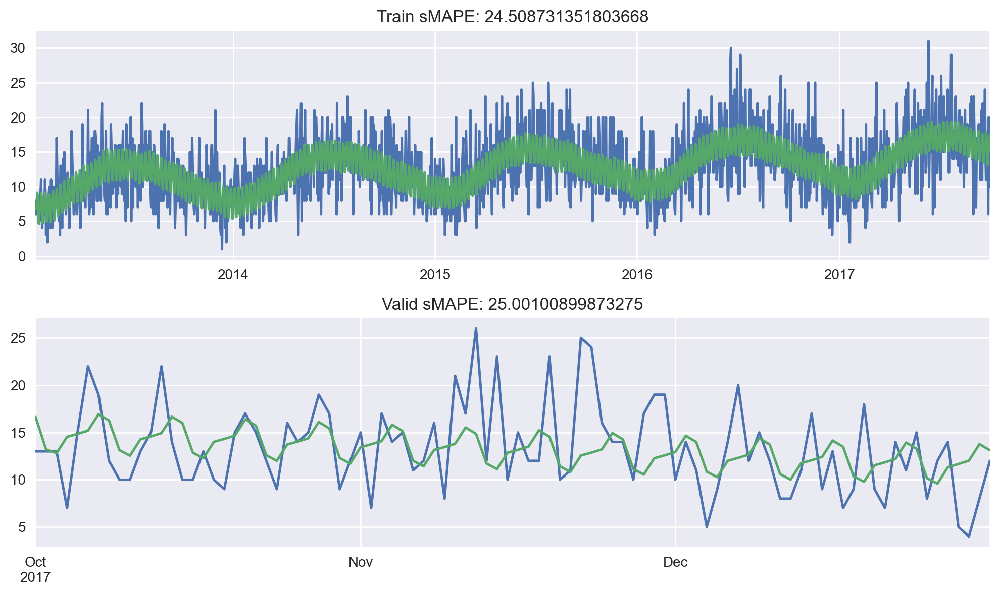

In [82]:
best_score = 3
f, ax = plt.subplots(2,1, figsize=(10,6))
endog_train[8:].plot(ax=ax[0])
models[best_score].fittedvalues()[8:].plot(ax=ax[0])
train_score = utils.sMAPE(endog_train[8:], models[best_score].fittedvalues()[8:])
ax[0].set_title(f'Train sMAPE: {train_score}')

endog_valid.plot(ax=ax[1])
models[best_score].predict(n_periods=92, X=exog_valid).plot(ax=ax[1])
valid_score = utils.sMAPE(endog_valid, models[best_score].predict(n_periods=92, X=exog_valid))
ax[1].set_title(f'Valid sMAPE: {valid_score}')

plt.tight_layout()
plt.show();

In [83]:
print(models[best_score].summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1734
Model:               SARIMAX(2, 1, 1)   Log Likelihood               -4733.865
Date:                Wed, 22 Nov 2023   AIC                           9491.730
Time:                        23:17:55   BIC                           9557.221
Sample:                    01-01-2013   HQIC                          9515.951
                         - 09-30-2017                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sin365_1      -0.3628      0.167     -2.168      0.030      -0.691      -0.035
sin7_1        -1.5572      0.120    -12.952      0.000      -1.793      -1.322
cos365_1      -2.8991      0.164    -17.663      0.0

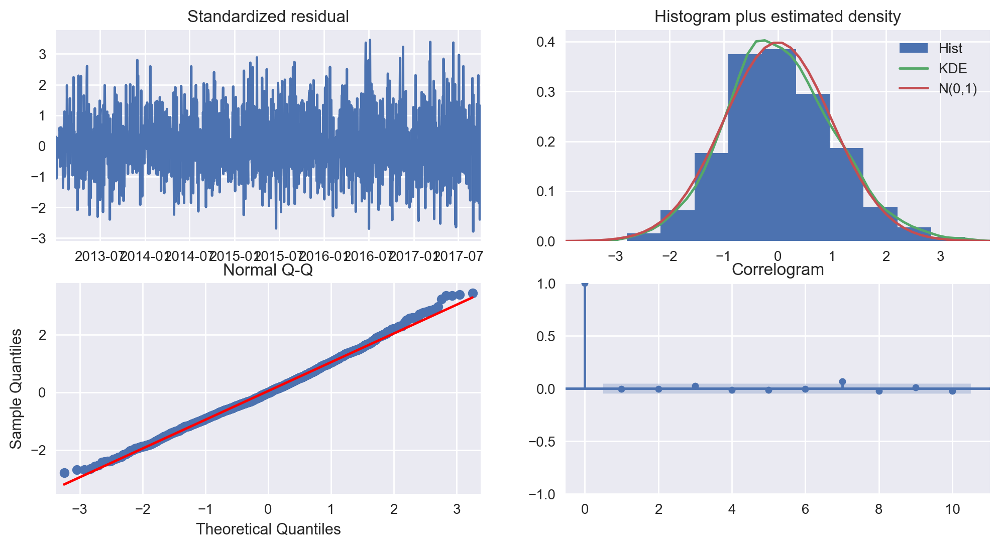

In [84]:
models[best_score].plot_diagnostics(figsize=(12,6));

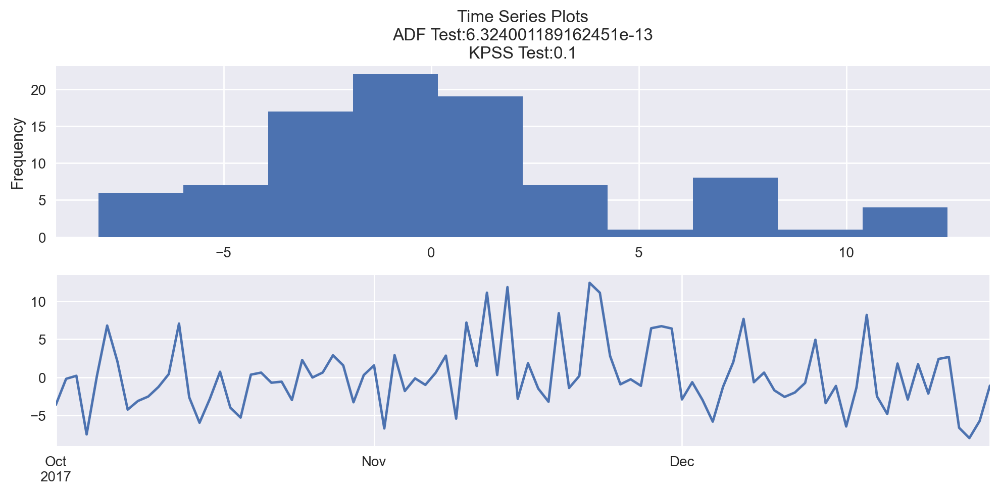

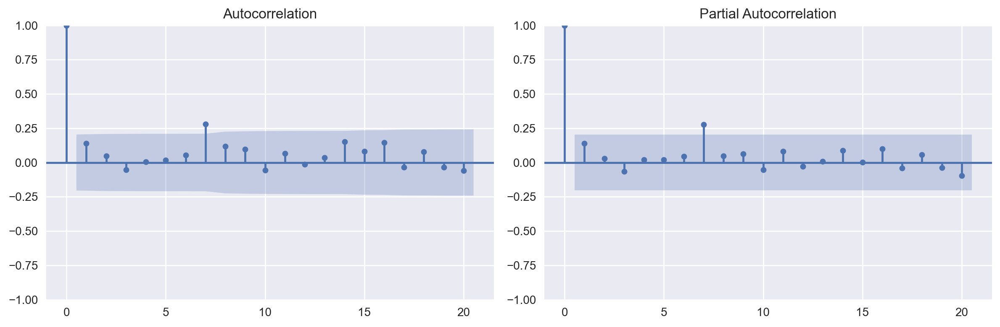

In [85]:
resid = endog_valid-models[best_score].predict(n_periods=92, X=exog_valid)
tstests.ts_plots(resid)
tstests.acf_pacf_plots(resid)

#### Fitting individual store-items

In [103]:
train_res = add_fourier_terms(train_res.copy())
valid_res = add_fourier_terms(valid_res.copy())

In [104]:
kwargs_sarimax2 = {
    'name' : 'sarimax_fourier',
    'f_kwargs' : {
        'sarimax_kwargs' : {
            'order': (2,1,1),
        },
        'exog_vars' : fourier_terms
    }
}

train_res, valid_res, si_scores_df, scores_df = utils.run_model(train_res, valid_res, 
                                       si_scores_df, scores_df,
                                       get_sarimax_forecast, **kwargs_sarimax2)

(1,1)  train : 19.913      valid : 21.5266
(1,2)  train : 17.0315      valid : 20.1016
(1,3)  train : 17.853      valid : 15.4263
(1,4)  train : 18.6402      valid : 19.2113
(1,5)  train : 21.5116      valid : 20.9282
(1,6)  train : 21.6766      valid : 22.5565
(1,7)  train : 22.74      valid : 21.6191
(1,8)  train : 18.1445      valid : 16.6458
(1,9)  train : 18.9715      valid : 17.8032
(1,10)  train : 18.6581      valid : 17.6599
-----------------------------------------------------
Item 1 Train sMAPE : 19.514
Item 1 Valid sMAPE : 19.3478
-----------------------------------------------------

(2,1)  train : 13.3667      valid : 13.1662
(2,2)  train : 11.7893      valid : 13.386
(2,3)  train : 12.4193      valid : 12.1938
(2,4)  train : 12.7447      valid : 13.4611
(2,5)  train : 14.1289      valid : 15.8392
(2,6)  train : 14.3064      valid : 16.6352
(2,7)  train : 14.7142      valid : 16.0233
(2,8)  train : 11.9176      valid : 13.256
(2,9)  train : 12.7139      valid : 13.3807
(2,

(14,7)  train : 14.8372      valid : 14.5699
(14,8)  train : 12.2876      valid : 13.3624
(14,9)  train : 12.5467      valid : 14.607
(14,10)  train : 12.6144      valid : 12.2306
-----------------------------------------------------
Item 14 Train sMAPE : 12.9891
Item 14 Valid sMAPE : 14.2047
-----------------------------------------------------

(15,1)  train : 11.8685      valid : 13.109
(15,2)  train : 10.345      valid : 11.6614
(15,3)  train : 10.2131      valid : 14.9681
(15,4)  train : 10.4537      valid : 12.745
(15,5)  train : 12.3588      valid : 12.5013
(15,6)  train : 12.232      valid : 15.1159
(15,7)  train : 12.6312      valid : 11.9183
(15,8)  train : 10.206      valid : 13.594
(15,9)  train : 10.7755      valid : 13.7011
(15,10)  train : 10.6657      valid : 13.5312
-----------------------------------------------------
Item 15 Train sMAPE : 11.1749
Item 15 Valid sMAPE : 13.2845
-----------------------------------------------------

(16,1)  train : 18.7061      valid : 

(28,1)  train : 11.616      valid : 14.706
(28,2)  train : 9.9204      valid : 14.0547
(28,3)  train : 10.3882      valid : 13.1175
(28,4)  train : 10.9323      valid : 12.7738
(28,5)  train : 11.9809      valid : 12.7748
(28,6)  train : 11.9984      valid : 14.0193
(28,7)  train : 12.5529      valid : 15.4306
(28,8)  train : 10.112      valid : 13.1888
(28,9)  train : 11.1036      valid : 12.5055
(28,10)  train : 10.5724      valid : 12.0715
-----------------------------------------------------
Item 28 Train sMAPE : 11.1177
Item 28 Valid sMAPE : 13.4642
-----------------------------------------------------

(29,1)  train : 12.1605      valid : 13.6946
(29,2)  train : 10.8214      valid : 13.0992
(29,3)  train : 11.3914      valid : 13.881
(29,4)  train : 12.1177      valid : 12.6018
(29,5)  train : 13.4661      valid : 15.2278
(29,6)  train : 12.7606      valid : 15.2816
(29,7)  train : 13.6103      valid : 14.9203
(29,8)  train : 11.3357      valid : 11.0339
(29,9)  train : 11.8759  

(41,5)  train : 22.3995      valid : 24.82
(41,6)  train : 22.7273      valid : 22.2512
(41,7)  train : 22.0985      valid : 27.7423
(41,8)  train : 17.8873      valid : 19.5755
(41,9)  train : 18.4649      valid : 22.346
(41,10)  train : 18.6127      valid : 15.628
-----------------------------------------------------
Item 41 Train sMAPE : 19.6311
Item 41 Valid sMAPE : 21.018
-----------------------------------------------------

(42,1)  train : 14.9057      valid : 18.8595
(42,2)  train : 14.0956      valid : 13.6689
(42,3)  train : 15.1053      valid : 16.572
(42,4)  train : 14.9201      valid : 16.6882
(42,5)  train : 17.0378      valid : 16.3406
(42,6)  train : 17.022      valid : 18.6983
(42,7)  train : 18.1749      valid : 19.1245
(42,8)  train : 14.561      valid : 17.5308
(42,9)  train : 15.6475      valid : 17.5358
(42,10)  train : 14.9605      valid : 14.3913
-----------------------------------------------------
Item 42 Train sMAPE : 15.643
Item 42 Valid sMAPE : 16.941
-----

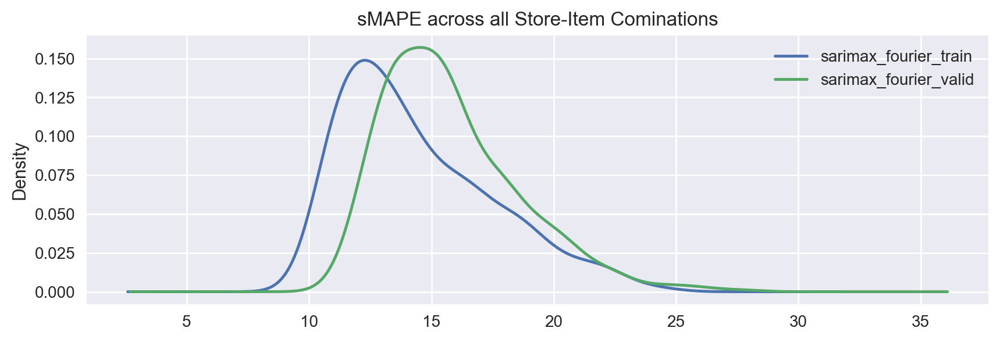

In [105]:
utils.plot_smape(si_scores_df, 'sarimax_fourier')

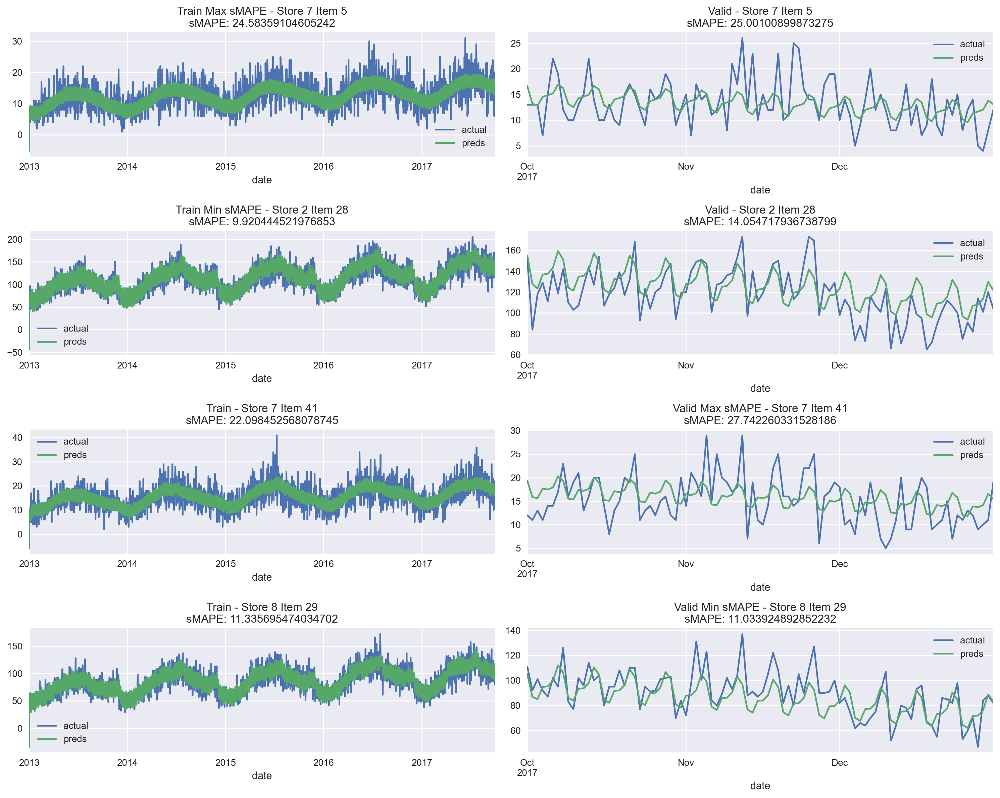

In [106]:
utils.plot_min_max_smape(train_res.loc[abs(train_res.sarimax_fourier) < 1000],
                         valid_res.loc[abs(valid_res.sarimax_fourier) < 1000],
                         si_scores_df,
                         'sarimax_fourier')

In [107]:
scores_df

,train,valid
rolling_mean,22.437843,20.195443
mstl_forecast,13.532152,14.055564
sarimax,13.001242,12.656115
sarimax_fourier,14.460812,15.800153


281/500 (56.2%) store-item time series failed stationarity test
451/500 (90.2%) store-item time series failed Ljung Box test


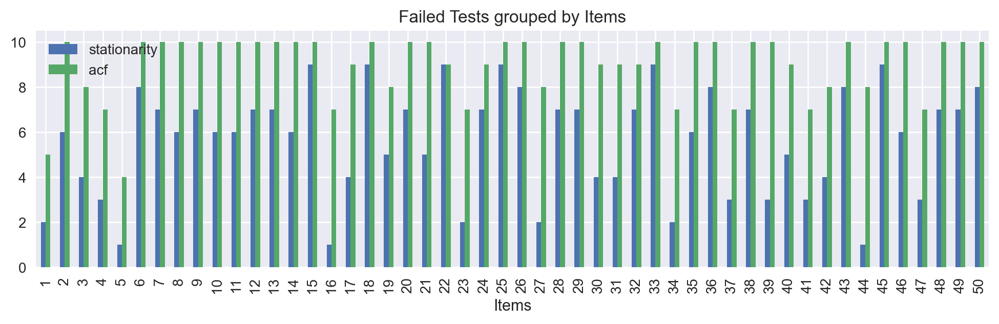

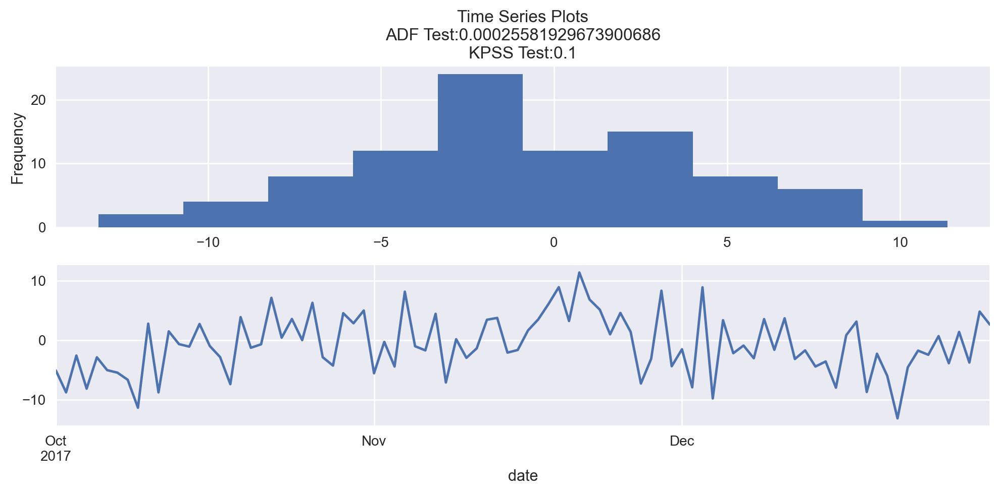

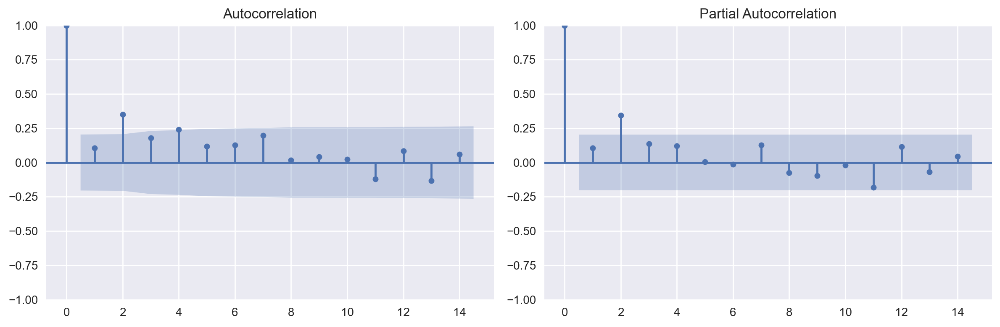

In [221]:
__, acf_arr = display_res_analysis(valid_res, 'sarimax_fourier', 14, 0)

In [219]:
acf_arr

[[1, 1],
 [1, 2],
 [1, 4],
 [1, 8],
 [1, 10],
 [2, 1],
 [2, 2],
 [2, 3],
 [2, 4],
 [2, 5],
 [2, 6],
 [2, 7],
 [2, 8],
 [2, 9],
 [2, 10],
 [3, 2],
 [3, 4],
 [3, 5],
 [3, 6],
 [3, 7],
 [3, 8],
 [3, 9],
 [3, 10],
 [4, 1],
 [4, 2],
 [4, 4],
 [4, 6],
 [4, 7],
 [4, 8],
 [4, 9],
 [5, 2],
 [5, 4],
 [5, 8],
 [5, 9],
 [6, 1],
 [6, 2],
 [6, 3],
 [6, 4],
 [6, 5],
 [6, 6],
 [6, 7],
 [6, 8],
 [6, 9],
 [6, 10],
 [7, 1],
 [7, 2],
 [7, 3],
 [7, 4],
 [7, 5],
 [7, 6],
 [7, 7],
 [7, 8],
 [7, 9],
 [7, 10],
 [8, 1],
 [8, 2],
 [8, 3],
 [8, 4],
 [8, 5],
 [8, 6],
 [8, 7],
 [8, 8],
 [8, 9],
 [8, 10],
 [9, 1],
 [9, 2],
 [9, 3],
 [9, 4],
 [9, 5],
 [9, 6],
 [9, 7],
 [9, 8],
 [9, 9],
 [9, 10],
 [10, 1],
 [10, 2],
 [10, 3],
 [10, 4],
 [10, 5],
 [10, 6],
 [10, 7],
 [10, 8],
 [10, 9],
 [10, 10],
 [11, 1],
 [11, 2],
 [11, 3],
 [11, 4],
 [11, 5],
 [11, 6],
 [11, 7],
 [11, 8],
 [11, 9],
 [11, 10],
 [12, 1],
 [12, 2],
 [12, 3],
 [12, 4],
 [12, 5],
 [12, 6],
 [12, 7],
 [12, 8],
 [12, 9],
 [12, 10],
 [13, 1],
 [13, 2],
 [13

### Temporal Features & Fourier Terms

Now we fit SARIMAX with both seasonal dummy vars + fourier terms

#### pmdautoarima

In [86]:
train_cp = train_data.copy()
train_cp.index = pd.DatetimeIndex(train_cp.index.values, freq=train_data_cp.index.inferred_freq)
train_cp = add_fourier_terms(train_cp)
train_cp = add_temporal_features(train_cp)

valid_cp = valid_data.copy()
valid_cp.index = pd.DatetimeIndex(valid_cp.index.values, freq=valid_cp.index.inferred_freq)
valid_cp = add_fourier_terms(valid_cp)
valid_cp = add_temporal_features(valid_cp)

In [87]:
endog_train = train_cp.loc[(train_cp.store == 7) & (train_cp.item == 5)].sales
exog_train = train_cp.loc[(train_cp.store == 7) & (train_cp.item == 5)][fourier_terms+temporal_features]

endog_valid = valid_cp.loc[(valid_cp.store == 7) & (valid_cp.item == 5)].sales
exog_valid = valid_cp.loc[(valid_cp.store == 7) & (valid_cp.item == 5)][fourier_terms+temporal_features]

In [88]:
models = pmd.auto_arima(endog_train,
                        exog_train,
                        start_p=0, 
                        start_q=0, 
                        start_P=0,
                        start_Q=0,
                        maxiter=100,
                        method='powell',
                        trace=True,
                        return_valid_fits=True,
                        stepwise=True)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=10630.063, Time=0.98 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=10119.743, Time=1.58 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=2.16 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=10628.063, Time=2.55 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=9896.258, Time=1.65 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=9804.396, Time=2.78 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=9757.173, Time=2.81 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=9696.163, Time=4.18 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=9437.885, Time=14.52 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=9459.870, Time=9.19 sec
 ARIMA(5,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=4.86 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=5.89 sec
 ARIMA(5,1,1)(0,0,0)[0]             : AIC=9438.865, Time=12.66 sec

Best model:  ARIMA(5,1,1)(0,0,0)[0] intercept
Total fit time: 65.820 seconds


In [89]:
scores = []
for i in range(len(models)):
    m = models[i]
    preds = m.predict(n_periods=92, X=exog_valid)
    score = utils.sMAPE(endog_valid, preds)
    scores.append(score)
    print(i, m, score)
    
print(np.argsort(scores))

0  ARIMA(5,1,1)(0,0,0)[0] intercept 23.723387697183753
1  ARIMA(5,1,1)(0,0,0)[0]           23.478757944058128
2  ARIMA(4,1,1)(0,0,0)[0] intercept 23.583877945232476
3  ARIMA(5,1,0)(0,0,0)[0] intercept 30.716486699496954
4  ARIMA(4,1,0)(0,0,0)[0] intercept 34.45547370731244
5  ARIMA(3,1,0)(0,0,0)[0] intercept 40.48752398828022
6  ARIMA(2,1,0)(0,0,0)[0] intercept 48.026365881828994
7  ARIMA(1,1,0)(0,0,0)[0] intercept 92.52254701876772
8  ARIMA(0,1,0)(0,0,0)[0]           124.57448312052935
9  ARIMA(0,1,0)(0,0,0)[0] intercept 126.61443430139146
[1 2 0 3 4 5 6 7 8 9]


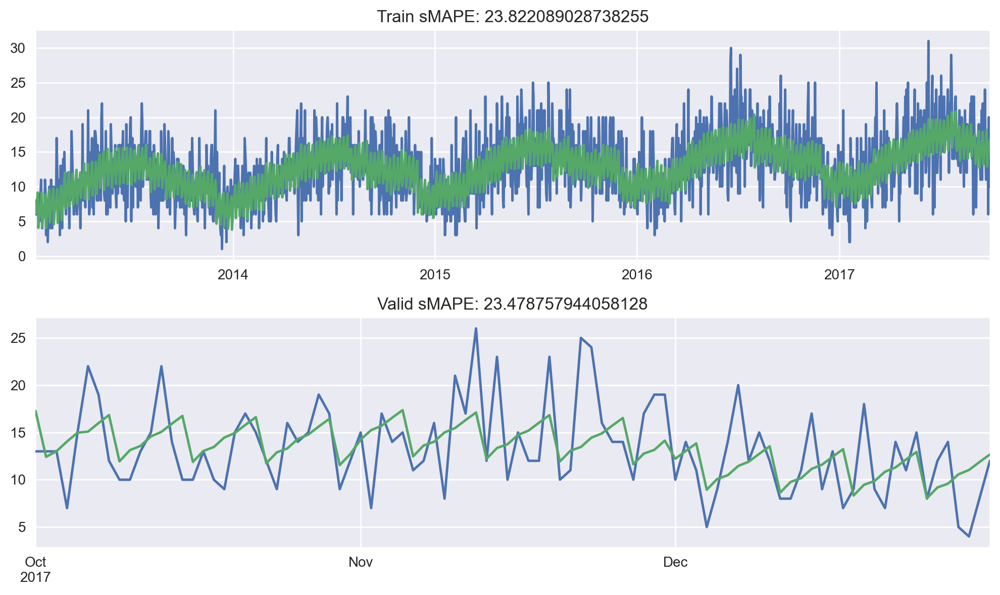

In [90]:
best_score = 1
f, ax = plt.subplots(2,1, figsize=(10,6))
endog_train[8:].plot(ax=ax[0])
models[best_score].fittedvalues()[8:].plot(ax=ax[0])
train_score = utils.sMAPE(endog_train[8:], models[best_score].fittedvalues()[8:])
ax[0].set_title(f'Train sMAPE: {train_score}')

endog_valid.plot(ax=ax[1])
models[best_score].predict(n_periods=92, X=exog_valid).plot(ax=ax[1])
valid_score = utils.sMAPE(endog_valid, models[best_score].predict(n_periods=92, X=exog_valid))
ax[1].set_title(f'Valid sMAPE: {valid_score}')

plt.tight_layout()
plt.show();

In [91]:
print(models[best_score].summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1734
Model:               SARIMAX(5, 1, 1)   Log Likelihood               -4687.433
Date:                Wed, 22 Nov 2023   AIC                           9438.865
Time:                        23:19:23   BIC                           9613.509
Sample:                    01-01-2013   HQIC                          9503.456
                         - 09-30-2017                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sin365_1      -1.7627      0.785     -2.244      0.025      -3.302      -0.223
sin7_1        -1.2065      0.096    -12.601      0.000      -1.394      -1.019
cos365_1      -0.4803      0.785     -0.612      0.5

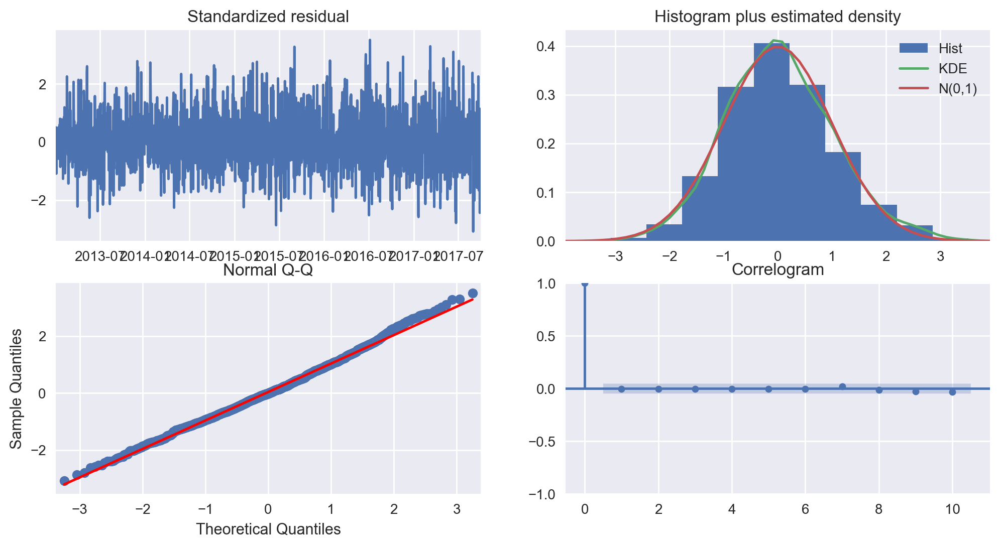

In [92]:
models[best_score].plot_diagnostics(figsize=(12,6));

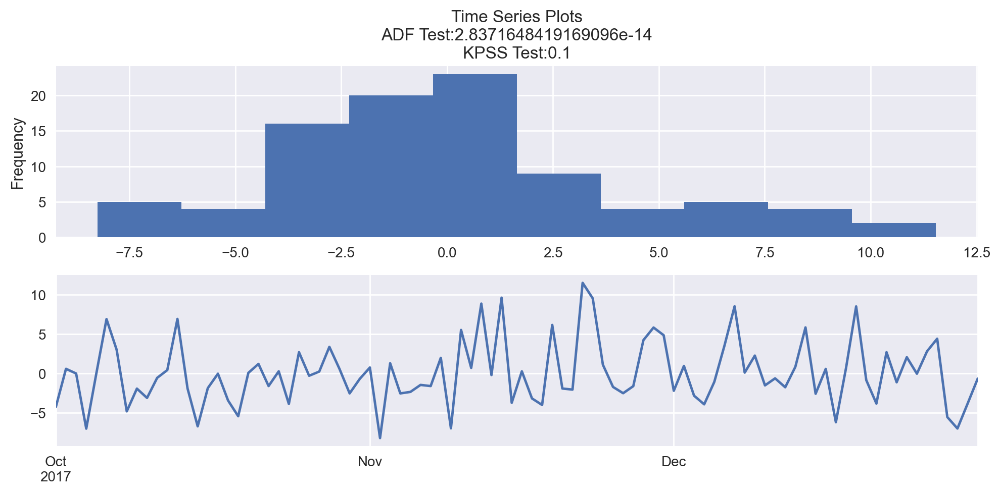

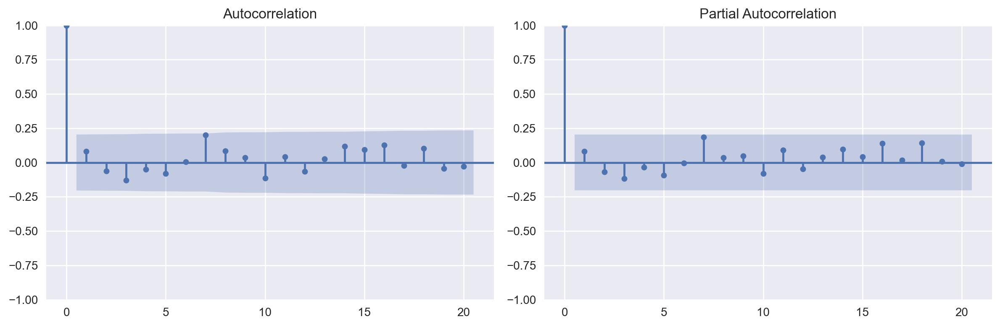

In [93]:
resid = endog_valid-models[best_score].predict(n_periods=92, X=exog_valid)
tstests.ts_plots(resid)
tstests.acf_pacf_plots(resid)

#### Fitting individual store item

In [108]:
kwargs_sarimax3 = {
    'name' : 'sarimax_fourier_seasonal',
    'f_kwargs' : {
        'sarimax_kwargs' : {
            'order': (5,1,1),
        },
        'exog_vars' : fourier_terms+temporal_features
    }
}

train_res, valid_res, si_scores_df, scores_df = utils.run_model(train_res, valid_res, 
                                       si_scores_df, scores_df,
                                       get_sarimax_forecast, **kwargs_sarimax3)

(1,1)  train : 18.8307      valid : 20.4829
(1,2)  train : 15.9238      valid : 16.6731
(1,3)  train : 16.9431      valid : 14.9179
(1,4)  train : 17.6725      valid : 17.5478
(1,5)  train : 20.8364      valid : 20.0657
(1,6)  train : 20.703      valid : 20.4868
(1,7)  train : 21.7826      valid : 20.2494
(1,8)  train : 16.9643      valid : 15.1255
(1,9)  train : 17.6169      valid : 14.579
(1,10)  train : 17.2526      valid : 12.9704
-----------------------------------------------------
Item 1 Train sMAPE : 18.4526
Item 1 Valid sMAPE : 17.3099
-----------------------------------------------------

(2,1)  train : 11.9394      valid : 10.2595
(2,2)  train : 10.1351      valid : 9.7329
(2,3)  train : 10.8553      valid : 8.6857
(2,4)  train : 11.1676      valid : 11.202
(2,5)  train : 12.6466      valid : 13.7883
(2,6)  train : 12.72      valid : 13.0655
(2,7)  train : 13.4767      valid : 14.3232
(2,8)  train : 10.2308      valid : 9.006
(2,9)  train : 11.2206      valid : 9.8811
(2,10)

(14,9)  train : 11.0472      valid : 9.8631
(14,10)  train : 11.0561      valid : 9.9929
-----------------------------------------------------
Item 14 Train sMAPE : 11.4585
Item 14 Valid sMAPE : 10.5675
-----------------------------------------------------

(15,1)  train : 9.9901      valid : 9.2595
(15,2)  train : 8.3167      valid : 6.8237
(15,3)  train : 8.8132      valid : 9.2366
(15,4)  train : 8.8705      valid : 8.0291
(15,5)  train : 10.7841      valid : 9.6543
(15,6)  train : 10.7388      valid : 12.3794
(15,7)  train : 11.2211      valid : 9.011
(15,8)  train : 8.5606      valid : 8.4356
(15,9)  train : 9.1264      valid : 9.1501
(15,10)  train : 8.8653      valid : 8.2821
-----------------------------------------------------
Item 15 Train sMAPE : 9.5287
Item 15 Valid sMAPE : 9.0261
-----------------------------------------------------

(16,1)  train : 17.5602      valid : 20.4456
(16,2)  train : 14.8318      valid : 16.76
(16,3)  train : 15.4469      valid : 13.5133
(16,4)  

(28,1)  train : 9.8231      valid : 9.5469
(28,2)  train : 8.2942      valid : 8.8512
(28,3)  train : 8.7106      valid : 9.3288
(28,4)  train : 9.2444      valid : 9.8913
(28,5)  train : 10.3134      valid : 9.5655
(28,6)  train : 10.6523      valid : 10.0022
(28,7)  train : 11.0583      valid : 10.898
(28,8)  train : 8.4056      valid : 8.7078
(28,9)  train : 9.4279      valid : 7.7573
(28,10)  train : 8.8857      valid : 8.2021
-----------------------------------------------------
Item 28 Train sMAPE : 9.4815
Item 28 Valid sMAPE : 9.2751
-----------------------------------------------------

(29,1)  train : 10.5709      valid : 9.8414
(29,2)  train : 9.0999      valid : 9.1313
(29,3)  train : 9.7798      valid : 9.7286
(29,4)  train : 10.6021      valid : 8.653
(29,5)  train : 11.9226      valid : 11.8761
(29,6)  train : 11.5709      valid : 12.6261
(29,7)  train : 12.3643      valid : 11.7039
(29,8)  train : 9.5831      valid : 8.1774
(29,9)  train : 10.5972      valid : 10.9981
(2

(41,7)  train : 21.1395      valid : 24.9726
(41,8)  train : 16.7878      valid : 16.9836
(41,9)  train : 17.4929      valid : 19.1201
(41,10)  train : 17.4385      valid : 15.6853
-----------------------------------------------------
Item 41 Train sMAPE : 18.5264
Item 41 Valid sMAPE : 18.9475
-----------------------------------------------------

(42,1)  train : 14.0615      valid : 15.9489
(42,2)  train : 12.6835      valid : 10.351
(42,3)  train : 13.5455      valid : 14.2936
(42,4)  train : 13.5705      valid : 13.6472
(42,5)  train : 15.9553      valid : 14.6919
(42,6)  train : 16.0199      valid : 16.9274
(42,7)  train : 16.9978      valid : 17.1019
(42,8)  train : 12.8868      valid : 12.687
(42,9)  train : 13.8919      valid : 14.5542
(42,10)  train : 13.5042      valid : 12.1847
-----------------------------------------------------
Item 42 Train sMAPE : 14.3117
Item 42 Valid sMAPE : 14.2388
-----------------------------------------------------

(43,1)  train : 12.6214      val

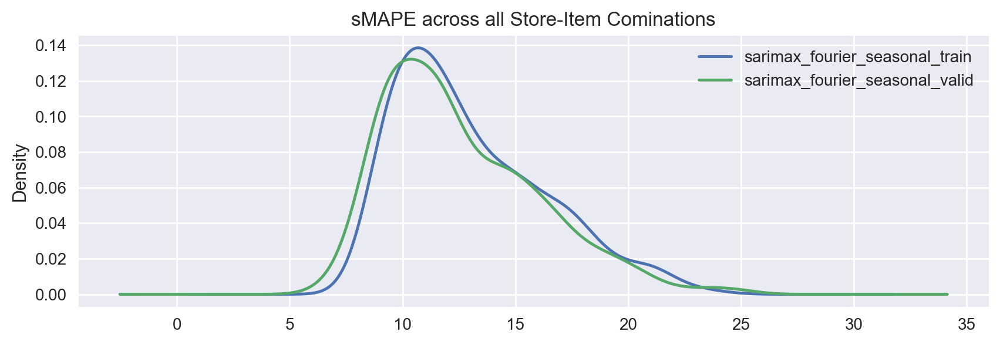

In [109]:
utils.plot_smape(si_scores_df, 'sarimax_fourier_seasonal')

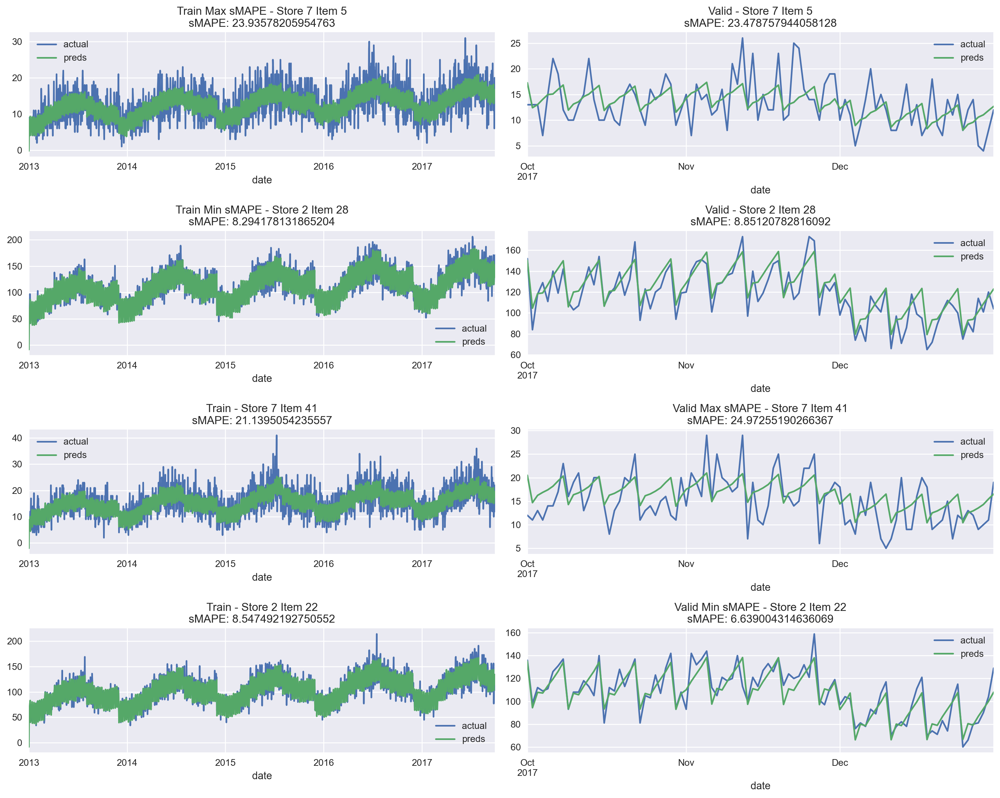

In [110]:
utils.plot_min_max_smape(train_res.loc[abs(train_res.sarimax_fourier_seasonal) < 1000],
                         valid_res.loc[abs(valid_res.sarimax_fourier_seasonal) < 1000],
                         si_scores_df,
                         'sarimax_fourier_seasonal')

In [111]:
scores_df

,train,valid
rolling_mean,22.437843,20.195443
mstl_forecast,13.532152,14.055564
sarimax,13.001242,12.656115
sarimax_fourier,14.460812,15.800153
sarimax_fourier_seasonal,13.019475,12.590845


7/500 (1.4000000000000001%) store-item time series failed stationarity test
104/500 (20.8%) store-item time series failed Ljung Box test


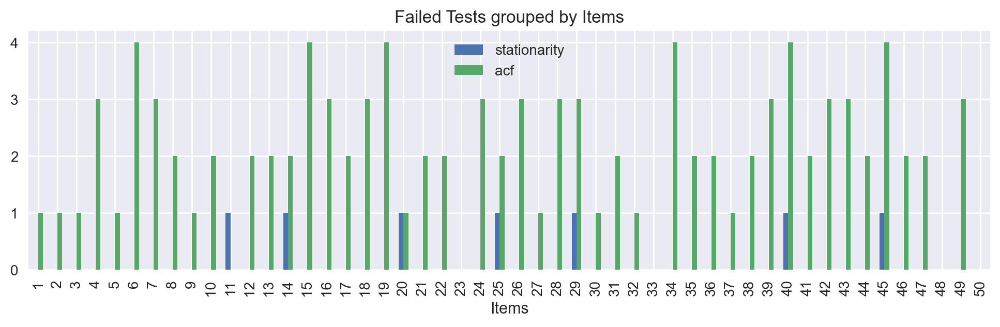

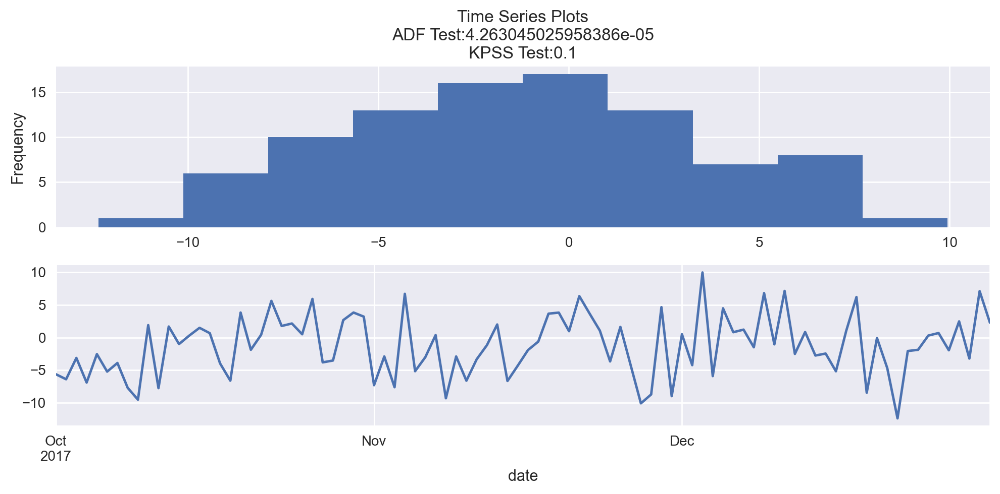

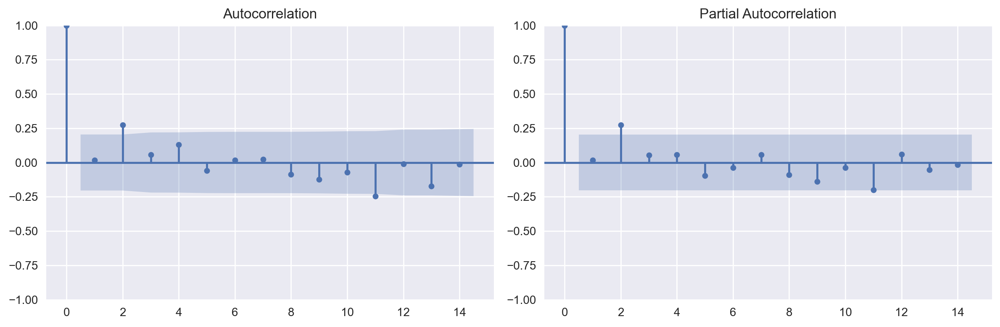

In [222]:
__, acf_arr = display_res_analysis(valid_res, 'sarimax_fourier_seasonal', 14, 0)

### MSTL Forecast with SARIMAX modelled Errors

In [128]:
df_train = train_res.loc[
    (train_res.store==7) & 
    (train_res.item==5),
    ['sales']
]

df_valid = valid_res.loc[
    (valid_res.store==7) & 
    (valid_res.item==5),
    ['sales']
]

In [129]:
f_kwargs = {
        'p' : [7, 7*52],
        'poly_fit_terms' : 2,
        'fourier_terms' : 20
    }

In [130]:
train_components, valid_components = get_mstl_forecast(df_train, df_valid, components=True, **f_kwargs)

In [131]:
cols = ['trend', 'seasonal_7', 'seasonal_364']

In [132]:
train_components = pd.DataFrame(np.transpose(train_components), columns=cols)
valid_components = pd.DataFrame(np.transpose(valid_components), columns=cols)
train_components.index = df_train.index
valid_components.index = df_valid.index 

train_components['mstl_forecast'] = train_components.sum(axis=1)
valid_components['mstl_forecast'] = valid_components.sum(axis=1)

train_components['resid'] = df_train.sales - train_components['mstl_forecast']
valid_components['resid'] = df_valid.sales - valid_components['mstl_forecast']

In [133]:
utils.sMAPE(df_valid.sales, valid_components.mstl_forecast)

24.589665039834614

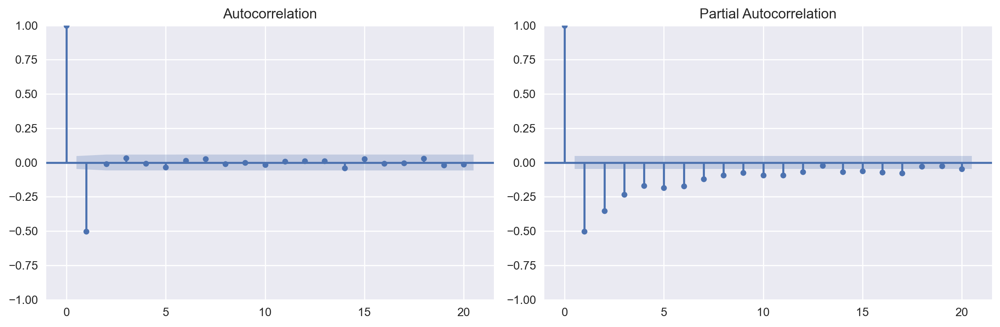

In [134]:
tstests.acf_pacf_plots((train_components.resid + train_components.trend).diff().dropna())

In [ ]:
f_kwargs = {
    'sarimax_kwargs' : {
        'order': (0,1,1),
    },
    'exog_vars' : ['seasonal_7', 'seasonal_28', 'seasonal_365']
}

In [ ]:
train_components['sales'] = df_train
valid_components['sales'] = df_valid

In [ ]:
preds_train, preds_valid = get_sarimax_forecast(train_components, valid_components, **f_kwargs)

In [ ]:
f, ax = plt.subplots(2,1, figsize=(10,6))
df_train.plot(ax=ax[0])
preds_train[1:].plot(ax=ax[0])
train_score = utils.sMAPE(df_train.sales, preds_train)
ax[0].set_title(f'Train sMAPE: {train_score}')

df_valid.plot(ax=ax[1])
preds_valid.plot(ax=ax[1])
valid_score = utils.sMAPE(df_valid.sales, preds_valid)
ax[1].set_title(f'Valid sMAPE: {valid_score}')

plt.tight_layout()
plt.show();

In [ ]:
def get_sarimax_mstl_forecast(train, valid, **f_kwargs):
    train_components, valid_components = get_mstl_forecast(train, valid, components=True, **f_kwargs)
    
    train_df = pd.DataFrame(np.transpose(train_components), columns=f_kwargs['cols'])
    valid_df = pd.DataFrame(np.transpose(valid_components), columns=f_kwargs['cols'])
    train_df.index = train.index
    valid_df.index = valid.index 
    train_df['sales'] = train['sales']
    valid_df['sales'] = valid['sales']
    
    preds_train, preds_valid = get_sarimax_forecast(train_df, valid_df, **f_kwargs)
    
    return preds_train, preds_valid

In [ ]:
periods = [7, 7*52]
kwargs_sarimax_mstl = {
    'name' : 'sarimax_mstl',
    'f_kwargs' : {
        'p' : periods,
        'poly_fit_terms' : 10,
        'fourier_terms' : 30,
        'sarimax_kwargs' : {
            'order': (0,1,1)
        },
        'cols' : ['trend'] + periods,
        'exog_vars' : periods
    }
}

In [ ]:
train_res, valid_res, si_scores_df, scores_df = utils.run_model(train_res, valid_res, 
                                       si_scores_df, scores_df,
                                       get_sarimax_mstl_forecast, **kwargs_sarimax_mstl)

In [ ]:
utils.plot_smape(si_scores_df, 'sarimax_mstl')

In [ ]:
utils.plot_min_max_smape(train_res.loc[abs(train_res.sarimax_mstl) < 1000],
                         valid_res.loc[abs(valid_res.sarimax_mstl) < 1000], si_scores_df, 'sarimax_mstl')

In [ ]:
scores_df

# Evaluation of Results

Evaluate experiment results to guide us in hyperparams tuning

In [ ]:
scores_df

In [ ]:
si_scores_df['si'] = si_scores_df.index
si_scores_df.head()

In [ ]:
si_scores_df['store'] = si_scores_df.si.apply(lambda x: int(x.split('_')[0][1:]))
si_scores_df['item'] = si_scores_df.si.apply(lambda x: int(x.split('_')[1][1:]))
si_scores_df.drop('si', axis=1, inplace=True)
si_scores_df

In [ ]:
def plot_scores(name, si_scores_df):
    si_scores_df[['store', f'{name}_train',
                    f'{name}_valid']].groupby('store').mean().sort_values(f'{name}_train').plot.bar(figsize=(10,3));
    si_scores_df[['item', f'{name}_train',
                    f'{name}_valid']].groupby('item').mean().sort_values(f'{name}_train').plot.bar(figsize=(10,3));

In [ ]:
plot_scores('sarimax_deseasoned', si_scores_df)

sarimax deseasoned forecast has the best bias out of all our models. But we see a clear variance problems

In [ ]:
plot_scores('sarimax_fourier_seasonal', si_scores_df)

While sarimax with fourier and seasonal variables has the best variance, it faces some overall bias issues